In [1]:
import random
import dill 
import datetime as dt
import glob 
from joblib import Parallel, delayed
import matplotlib.pyplot as plt
import pandas as pd
import scipy.spatial as spatial
import sys 
wd=".."
sys.path.append(wd+'//CPN//')
import numpy as np 
import statsmodels.api as sm
from tqdm import tqdm_notebook, tqdm
import brokenaxes
import math
import os
from analysis_misc_functions import *

In [2]:
group_heading_variation = [0, 10, 30, 50, "swarming", "flocking"]
list_of_folder_ids_all_heading_vars= []
list_of_folder_ids_array_version_all_heading_vars= []
for heading_var in group_heading_variation:
    results_folder = wd+"/simulations/effect_of_heading_plus_radial/store_results/"+str(heading_var)+"/"
    list_of_folder_ids= glob.glob(results_folder+"*", recursive=True)
    list_of_folder_ids= np.sort(list_of_folder_ids)
    # # glob.glob(results_folder+"*")
    def clean_string_and_int_labels(input):
        try:
            output= float(input)
        except ValueError:
            output= input[1:-1]
        return output

    list_of_folder_ids= [str(i) for i in list_of_folder_ids]
    # list_of_folder_ids
    list_of_folder_ids_array_version= [i[len(results_folder):] for i in list_of_folder_ids]
    list_of_folder_ids_array_version= [i.split(",") for i in list_of_folder_ids_array_version]
    list_of_folder_ids_array_version= [(n[0][1:],n[1][1:], n[2][1:-1]) for n in list_of_folder_ids_array_version]
    list_of_folder_ids_array_version= [(float(n[0]), float(n[1]), clean_string_and_int_labels(n[2])) for n in list_of_folder_ids_array_version]


    list_of_folder_ids_all_heading_vars.append(list_of_folder_ids)
    list_of_folder_ids_array_version_all_heading_vars.append(list_of_folder_ids_array_version)

In [3]:
list_of_folder_ids_array_version[0][0]

1.0

In [4]:
folder_id= list_of_folder_ids_all_heading_vars[2][0]
all_results = glob.glob(folder_id+'/*.simresults')
some_results = random.sample(all_results, int(len(all_results)*1.0))
all_results

['../simulations/effect_of_heading_plus_radial/store_results/30/(1, 1.5707963267948966, 30)/heading_plus_radial_30_7efd82c8-b3e2-4864-ab31-e4026cefb8a1_863749639_.simresults',
 '../simulations/effect_of_heading_plus_radial/store_results/30/(1, 1.5707963267948966, 30)/heading_plus_radial_30_7c586cb1-869a-41a3-b0ae-0ff17fbc5a06_874361429_.simresults',
 '../simulations/effect_of_heading_plus_radial/store_results/30/(1, 1.5707963267948966, 30)/heading_plus_radial_30_31ab3c5d-6f7e-4aaa-86d2-f9ee67d75c42_760668310_.simresults',
 '../simulations/effect_of_heading_plus_radial/store_results/30/(1, 1.5707963267948966, 30)/heading_plus_radial_30_e9abc5a9-b385-4ab2-bca4-8b1a7f05d091_457256173_.simresults',
 '../simulations/effect_of_heading_plus_radial/store_results/30/(1, 1.5707963267948966, 30)/heading_plus_radial_30_44376608-9847-4d12-8696-13d5ef2518b0_857476430_.simresults',
 '../simulations/effect_of_heading_plus_radial/store_results/30/(1, 1.5707963267948966, 30)/heading_plus_radial_30_2a950

In [5]:
extraction_fns = [get_num_echoes_heard, get_group_size, get_furthest_bat2bat_distance,
                 get_nearest_neighbour_distances, get_detection_distance, get_run_uuid,
                  get_run_random_seed,make_paramset_id, extract_parameter_values,
                 get_echo_levels, get_detection_azimuth]
keyword_arguments = {'nearest_nbrs':3}

In [6]:
keyword_arguments['variables_to_extract'] = ['heading_variation', 'echocall_duration','atmospheric_attenuation','min_spacing','source_level',
                        'interpulse_interval', 'implement_shadowing',
                                            ]

In [7]:
what_to_do = input('Do you want to "rerun" from scratch or 2, "reanalyse" from previous data')
task_type= input('What type of analysis is this?')

In [8]:
what_to_do

'rerun'

In [9]:
# if what_to_do == 'rerun':
store_info= {}
for heading_var in group_heading_variation:
    index= group_heading_variation.index(heading_var)
    list_of_folder_ids= list_of_folder_ids_all_heading_vars[index]; list_of_folder_ids_array_version= list_of_folder_ids_array_version_all_heading_vars[index]
    array_containing_all_simulation_datasets_raw = []
    iterant=0
    yyyymmdd = dt.datetime.now()
    timestamp = str([yyyymmdd.year,yyyymmdd.month,yyyymmdd.day,yyyymmdd.hour])
    make_dir(task_type+'_data'+timestamp+"/")
    for folder_id in list_of_folder_ids:
        all_results = glob.glob(folder_id+'/*.simresults')
        some_results =random.sample(all_results, int(len(all_results)*1.0))
        
        %time extracted_simdata = Parallel(n_jobs=4)(delayed(load_and_extract)(each, extraction_fns, **keyword_arguments) for each in tqdm(some_results))
        # print(extracted_simdata)
        echoes_heard = []
        group_size = []
        group_diameter = []
        nearest_3nbrs = []
        nbr_detection_range = []
        uuid = []
        seed = []
        param_ids = []
        parameter_values = []
        echo_levels = []
        detection_angle = []
        for each in extracted_simdata:
            for variable, list_to_append in zip(each, [echoes_heard, group_size, group_diameter,
                                                    nearest_3nbrs, nbr_detection_range,
                                                    uuid, seed, param_ids, parameter_values,
                                                    echo_levels, detection_angle]):
                list_to_append.append(variable)
        simulation_data = pd.DataFrame(data = {'nbrs_detected':echoes_heard,
                                        'group_size':group_size,
                                        'group_diameter':group_diameter,
                                        'nearest_neighbour_distance':nearest_3nbrs,
                                        'nbrs_detected_distance':nbr_detection_range,
                                        'uuid':uuid,
                                        'seed':seed,
                                        'paramset_id':param_ids,
                                        'parameters_joint':parameter_values,
                                        'echo_levels':echo_levels,
                                        'detection_azimuth':detection_angle})
        column_names = keyword_arguments['variables_to_extract']

        for each in column_names:
            simulation_data[each] = np.nan

        %time simulation_data = simulation_data.apply(split_parameters_joint_to_separate_columns, 1, col_names=column_names)    
        

        simulation_data["focal_bat"]= len(simulation_data)*[list_of_folder_ids_array_version[iterant]]

        ##### thanks to https://realpython.com/fast-flexible-pandas/#but-i-heard-that-pandas-is-slow
        # data_store = pd.HDFStore(task_type+'_data'+timestamp+'/'+folder_id+'.h5')
        # data_store['simulation_data'] = simulation_data
        # data_store.close()

        array_containing_all_simulation_datasets_raw.append(simulation_data)
        iterant+=1
    store_info[heading_var]= array_containing_all_simulation_datasets_raw
        
# if what_to_do == 'reanalyse':
#     # show all datasets in the folder
#     data_stores_in_folder = glob.glob(task_type+'_*]')

#     datastores_by_index = pd.DataFrame(data={'data_stores':data_stores_in_folder})
#     print(datastores_by_index)
#     # user-inputs dataset choice:
#     which_dataset = int(input('Give the index of the dataset you want to'))
#     print()
#     # load a pre-exisiting dataset
#     #load the saved data 
#     list_of_h5_files_in_folder= making_glob_work_properly(datastores_by_index["data_stores"][which_dataset])
#     # print(list_of_h5_files_in_folder); print("./"+datastores_by_index["data_stores"][which_dataset]+'/*')
#     array_containing_all_simulation_datasets_raw = []
#     list_of_folder_ids, list_of_folder_ids_array_version= run_while_reanalysis_to_change_folder_ids(list_of_h5_files_in_folder)
#     for h5_file in list_of_h5_files_in_folder:
#         data_load = pd.HDFStore("./"+datastores_by_index["data_stores"][which_dataset]+'/'+h5_file)
#         simulation_data = data_load['simulation_data']
#         array_containing_all_simulation_datasets_raw.append(simulation_data)
#         data_load.close()

# else:
#     raise IOError('Invalid input given!!')

100%|██████████| 600/600 [00:01<00:00, 474.26it/s]


CPU times: user 62.7 ms, sys: 12.1 ms, total: 74.8 ms
Wall time: 1.53 s
CPU times: user 34.4 ms, sys: 12 μs, total: 34.4 ms
Wall time: 34.5 ms


100%|██████████| 600/600 [00:00<00:00, 1371.72it/s]


CPU times: user 46 ms, sys: 6.02 ms, total: 52 ms
Wall time: 718 ms
CPU times: user 33 ms, sys: 0 ns, total: 33 ms
Wall time: 33.1 ms


100%|██████████| 501/501 [00:00<00:00, 1860.22it/s]


CPU times: user 39.2 ms, sys: 8.17 ms, total: 47.4 ms
Wall time: 558 ms
CPU times: user 69.4 ms, sys: 0 ns, total: 69.4 ms
Wall time: 69.5 ms


100%|██████████| 502/502 [00:00<00:00, 1956.64it/s]


CPU times: user 43.2 ms, sys: 3.01 ms, total: 46.2 ms
Wall time: 538 ms
CPU times: user 28 ms, sys: 999 μs, total: 29 ms
Wall time: 29.1 ms


100%|██████████| 400/400 [00:00<00:00, 1328.23it/s]


CPU times: user 39.5 ms, sys: 3.17 ms, total: 42.7 ms
Wall time: 519 ms
CPU times: user 22.7 ms, sys: 0 ns, total: 22.7 ms
Wall time: 22.7 ms


100%|██████████| 400/400 [00:00<00:00, 1390.04it/s]


CPU times: user 33.6 ms, sys: 4.36 ms, total: 38 ms
Wall time: 497 ms
CPU times: user 22.4 ms, sys: 0 ns, total: 22.4 ms
Wall time: 22.4 ms


100%|██████████| 299/299 [00:00<00:00, 1518.05it/s]


CPU times: user 30.2 ms, sys: 7.11 ms, total: 37.4 ms
Wall time: 325 ms
CPU times: user 16.7 ms, sys: 0 ns, total: 16.7 ms
Wall time: 16.6 ms


100%|██████████| 300/300 [00:00<00:00, 1565.63it/s]


CPU times: user 36 ms, sys: 4.21 ms, total: 40.2 ms
Wall time: 375 ms
CPU times: user 16.8 ms, sys: 0 ns, total: 16.8 ms
Wall time: 16.8 ms


100%|██████████| 200/200 [00:00<00:00, 1412.07it/s]


CPU times: user 22.4 ms, sys: 1.34 ms, total: 23.8 ms
Wall time: 266 ms
CPU times: user 14.4 ms, sys: 0 ns, total: 14.4 ms
Wall time: 14.5 ms


100%|██████████| 200/200 [00:00<00:00, 1447.56it/s]


CPU times: user 24.2 ms, sys: 1.79 ms, total: 25.9 ms
Wall time: 234 ms
CPU times: user 11.3 ms, sys: 0 ns, total: 11.3 ms
Wall time: 11.3 ms


100%|██████████| 100/100 [00:00<00:00, 1543.03it/s]


CPU times: user 13.2 ms, sys: 2.01 ms, total: 15.3 ms
Wall time: 123 ms
CPU times: user 6.01 ms, sys: 0 ns, total: 6.01 ms
Wall time: 6.01 ms


100%|██████████| 100/100 [00:00<00:00, 1484.33it/s]


CPU times: user 14.4 ms, sys: 973 μs, total: 15.4 ms
Wall time: 133 ms
CPU times: user 6.16 ms, sys: 0 ns, total: 6.16 ms
Wall time: 6.15 ms


0it [00:00, ?it/s]


CPU times: user 1.54 ms, sys: 0 ns, total: 1.54 ms
Wall time: 1.32 ms
CPU times: user 326 μs, sys: 0 ns, total: 326 μs
Wall time: 309 μs


0it [00:00, ?it/s]


CPU times: user 1.43 ms, sys: 0 ns, total: 1.43 ms
Wall time: 1.26 ms
CPU times: user 192 μs, sys: 0 ns, total: 192 μs
Wall time: 191 μs


100%|██████████| 600/600 [00:00<00:00, 1473.97it/s]


CPU times: user 48.9 ms, sys: 4.04 ms, total: 53 ms
Wall time: 642 ms
CPU times: user 31.2 ms, sys: 0 ns, total: 31.2 ms
Wall time: 31.3 ms


100%|██████████| 600/600 [00:00<00:00, 1571.76it/s]


CPU times: user 45.8 ms, sys: 3.19 ms, total: 49 ms
Wall time: 619 ms
CPU times: user 72.1 ms, sys: 0 ns, total: 72.1 ms
Wall time: 72.1 ms


100%|██████████| 500/500 [00:00<00:00, 2042.54it/s]


CPU times: user 36.2 ms, sys: 2.18 ms, total: 38.4 ms
Wall time: 507 ms
CPU times: user 27.5 ms, sys: 7 μs, total: 27.5 ms
Wall time: 27.5 ms


100%|██████████| 501/501 [00:00<00:00, 1772.67it/s]


CPU times: user 40.2 ms, sys: 5.1 ms, total: 45.3 ms
Wall time: 618 ms
CPU times: user 29.1 ms, sys: 0 ns, total: 29.1 ms
Wall time: 29.1 ms


100%|██████████| 400/400 [00:00<00:00, 1297.42it/s]


CPU times: user 28.4 ms, sys: 4.14 ms, total: 32.6 ms
Wall time: 516 ms
CPU times: user 22.3 ms, sys: 2 μs, total: 22.3 ms
Wall time: 22.3 ms


100%|██████████| 400/400 [00:00<00:00, 1311.96it/s]


CPU times: user 29.7 ms, sys: 2.96 ms, total: 32.6 ms
Wall time: 536 ms
CPU times: user 22.8 ms, sys: 0 ns, total: 22.8 ms
Wall time: 22.8 ms


100%|██████████| 299/299 [00:00<00:00, 1230.05it/s]


CPU times: user 36 ms, sys: 1.23 ms, total: 37.3 ms
Wall time: 397 ms
CPU times: user 17.3 ms, sys: 0 ns, total: 17.3 ms
Wall time: 17.2 ms


100%|██████████| 299/299 [00:00<00:00, 1130.40it/s]


CPU times: user 34 ms, sys: 4.08 ms, total: 38.1 ms
Wall time: 456 ms
CPU times: user 16.9 ms, sys: 0 ns, total: 16.9 ms
Wall time: 16.9 ms


100%|██████████| 200/200 [00:00<00:00, 1106.98it/s]


CPU times: user 24.6 ms, sys: 2.19 ms, total: 26.8 ms
Wall time: 305 ms
CPU times: user 12.3 ms, sys: 3 μs, total: 12.3 ms
Wall time: 12.3 ms


100%|██████████| 200/200 [00:00<00:00, 1226.44it/s]


CPU times: user 19.5 ms, sys: 3.16 ms, total: 22.7 ms
Wall time: 276 ms
CPU times: user 11.5 ms, sys: 0 ns, total: 11.5 ms
Wall time: 11.5 ms


100%|██████████| 100/100 [00:00<00:00, 1146.40it/s]


CPU times: user 17.8 ms, sys: 1.19 ms, total: 19 ms
Wall time: 163 ms
CPU times: user 6.51 ms, sys: 0 ns, total: 6.51 ms
Wall time: 6.46 ms


100%|██████████| 100/100 [00:00<00:00, 1156.54it/s]


CPU times: user 17.9 ms, sys: 2.07 ms, total: 20 ms
Wall time: 174 ms
CPU times: user 6.57 ms, sys: 9 μs, total: 6.58 ms
Wall time: 6.7 ms


0it [00:00, ?it/s]


CPU times: user 1.36 ms, sys: 1.03 ms, total: 2.39 ms
Wall time: 2.29 ms
CPU times: user 277 μs, sys: 14 μs, total: 291 μs
Wall time: 284 μs


0it [00:00, ?it/s]


CPU times: user 1.78 ms, sys: 1 ms, total: 2.78 ms
Wall time: 2.47 ms
CPU times: user 267 μs, sys: 13 μs, total: 280 μs
Wall time: 275 μs


100%|██████████| 600/600 [00:00<00:00, 1331.33it/s]


CPU times: user 99.8 ms, sys: 3.01 ms, total: 103 ms
Wall time: 794 ms
CPU times: user 33.1 ms, sys: 0 ns, total: 33.1 ms
Wall time: 33.2 ms


100%|██████████| 600/600 [00:00<00:00, 1302.16it/s]


CPU times: user 49.1 ms, sys: 7.31 ms, total: 56.4 ms
Wall time: 752 ms
CPU times: user 32.9 ms, sys: 980 μs, total: 33.9 ms
Wall time: 33.9 ms


100%|██████████| 501/501 [00:00<00:00, 1550.11it/s]


CPU times: user 48.8 ms, sys: 3.86 ms, total: 52.6 ms
Wall time: 649 ms
CPU times: user 30.3 ms, sys: 0 ns, total: 30.3 ms
Wall time: 30.4 ms


100%|██████████| 500/500 [00:00<00:00, 1573.35it/s]


CPU times: user 44 ms, sys: 7.99 ms, total: 52 ms
Wall time: 648 ms
CPU times: user 28.2 ms, sys: 0 ns, total: 28.2 ms
Wall time: 28.2 ms


100%|██████████| 400/400 [00:00<00:00, 1272.42it/s]


CPU times: user 29.4 ms, sys: 7.09 ms, total: 36.4 ms
Wall time: 518 ms
CPU times: user 23.3 ms, sys: 960 μs, total: 24.3 ms
Wall time: 24.3 ms


100%|██████████| 400/400 [00:00<00:00, 1294.01it/s]


CPU times: user 31.4 ms, sys: 2.08 ms, total: 33.5 ms
Wall time: 506 ms
CPU times: user 22.7 ms, sys: 0 ns, total: 22.7 ms
Wall time: 22.7 ms


100%|██████████| 300/300 [00:00<00:00, 1268.78it/s]


CPU times: user 34.2 ms, sys: 5.25 ms, total: 39.4 ms
Wall time: 405 ms
CPU times: user 16.8 ms, sys: 27 μs, total: 16.8 ms
Wall time: 16.7 ms


100%|██████████| 300/300 [00:00<00:00, 1267.06it/s]


CPU times: user 32.6 ms, sys: 6.15 ms, total: 38.8 ms
Wall time: 406 ms
CPU times: user 18.8 ms, sys: 0 ns, total: 18.8 ms
Wall time: 18.8 ms


100%|██████████| 200/200 [00:00<00:00, 1174.33it/s]


CPU times: user 24.7 ms, sys: 770 μs, total: 25.5 ms
Wall time: 294 ms
CPU times: user 60 ms, sys: 0 ns, total: 60 ms
Wall time: 60.1 ms


100%|██████████| 200/200 [00:00<00:00, 1195.62it/s]


CPU times: user 21.6 ms, sys: 1.34 ms, total: 22.9 ms
Wall time: 285 ms
CPU times: user 11.2 ms, sys: 0 ns, total: 11.2 ms
Wall time: 11.2 ms


100%|██████████| 100/100 [00:00<00:00, 1237.86it/s]


CPU times: user 13.8 ms, sys: 2.84 ms, total: 16.6 ms
Wall time: 153 ms
CPU times: user 6.06 ms, sys: 0 ns, total: 6.06 ms
Wall time: 6.06 ms


100%|██████████| 100/100 [00:00<00:00, 1008.83it/s]


CPU times: user 20.3 ms, sys: 227 μs, total: 20.5 ms
Wall time: 173 ms
CPU times: user 6.2 ms, sys: 0 ns, total: 6.2 ms
Wall time: 6.16 ms


0it [00:00, ?it/s]


CPU times: user 1.38 ms, sys: 19 μs, total: 1.4 ms
Wall time: 1.24 ms
CPU times: user 236 μs, sys: 0 ns, total: 236 μs
Wall time: 232 μs


0it [00:00, ?it/s]


CPU times: user 1.37 ms, sys: 0 ns, total: 1.37 ms
Wall time: 1.18 ms
CPU times: user 184 μs, sys: 0 ns, total: 184 μs
Wall time: 176 μs


100%|██████████| 600/600 [00:00<00:00, 1360.09it/s]


CPU times: user 39.6 ms, sys: 4.17 ms, total: 43.7 ms
Wall time: 718 ms
CPU times: user 37.4 ms, sys: 0 ns, total: 37.4 ms
Wall time: 37.9 ms


100%|██████████| 600/600 [00:00<00:00, 1355.57it/s]


CPU times: user 45.2 ms, sys: 3.98 ms, total: 49.2 ms
Wall time: 719 ms
CPU times: user 33 ms, sys: 0 ns, total: 33 ms
Wall time: 33 ms


100%|██████████| 500/500 [00:00<00:00, 1677.85it/s]


CPU times: user 39.1 ms, sys: 5.09 ms, total: 44.2 ms
Wall time: 620 ms
CPU times: user 27.5 ms, sys: 0 ns, total: 27.5 ms
Wall time: 27.5 ms


100%|██████████| 503/503 [00:00<00:00, 1669.11it/s]


CPU times: user 40.3 ms, sys: 2.83 ms, total: 43.1 ms
Wall time: 627 ms
CPU times: user 28.2 ms, sys: 0 ns, total: 28.2 ms
Wall time: 28.3 ms


100%|██████████| 400/400 [00:00<00:00, 1260.83it/s]


CPU times: user 33.6 ms, sys: 2.24 ms, total: 35.9 ms
Wall time: 528 ms
CPU times: user 22.1 ms, sys: 0 ns, total: 22.1 ms
Wall time: 22.1 ms


100%|██████████| 400/400 [00:00<00:00, 1326.00it/s]


CPU times: user 30.8 ms, sys: 3.19 ms, total: 34 ms
Wall time: 496 ms
CPU times: user 22.5 ms, sys: 5 μs, total: 22.5 ms
Wall time: 22.5 ms


100%|██████████| 300/300 [00:00<00:00, 1253.81it/s]


CPU times: user 38.3 ms, sys: 887 μs, total: 39.2 ms
Wall time: 397 ms
CPU times: user 16.5 ms, sys: 0 ns, total: 16.5 ms
Wall time: 16.5 ms


100%|██████████| 300/300 [00:00<00:00, 1282.87it/s]


CPU times: user 31.7 ms, sys: 3.89 ms, total: 35.6 ms
Wall time: 395 ms
CPU times: user 16.4 ms, sys: 9 μs, total: 16.4 ms
Wall time: 16.4 ms


100%|██████████| 200/200 [00:00<00:00, 1243.15it/s]


CPU times: user 16.4 ms, sys: 7.05 ms, total: 23.4 ms
Wall time: 275 ms
CPU times: user 11.7 ms, sys: 0 ns, total: 11.7 ms
Wall time: 11.7 ms


100%|██████████| 200/200 [00:00<00:00, 1246.92it/s]


CPU times: user 23.6 ms, sys: 1.36 ms, total: 24.9 ms
Wall time: 294 ms
CPU times: user 64.4 ms, sys: 0 ns, total: 64.4 ms
Wall time: 64.3 ms


100%|██████████| 100/100 [00:00<00:00, 1366.99it/s]


CPU times: user 16.2 ms, sys: 964 μs, total: 17.2 ms
Wall time: 154 ms
CPU times: user 6.62 ms, sys: 2 μs, total: 6.62 ms
Wall time: 6.64 ms


100%|██████████| 100/100 [00:00<00:00, 1301.83it/s]


CPU times: user 18.3 ms, sys: 1.96 ms, total: 20.2 ms
Wall time: 153 ms
CPU times: user 5.91 ms, sys: 0 ns, total: 5.91 ms
Wall time: 5.91 ms


0it [00:00, ?it/s]


CPU times: user 1.58 ms, sys: 0 ns, total: 1.58 ms
Wall time: 1.67 ms
CPU times: user 196 μs, sys: 0 ns, total: 196 μs
Wall time: 199 μs


0it [00:00, ?it/s]


CPU times: user 1.43 ms, sys: 0 ns, total: 1.43 ms
Wall time: 1.19 ms
CPU times: user 189 μs, sys: 0 ns, total: 189 μs
Wall time: 187 μs


100%|██████████| 600/600 [00:00<00:00, 1603.25it/s]


CPU times: user 42.3 ms, sys: 5.98 ms, total: 48.3 ms
Wall time: 617 ms
CPU times: user 29.9 ms, sys: 2 ms, total: 31.9 ms
Wall time: 31.9 ms


100%|██████████| 600/600 [00:00<00:00, 1434.69it/s]


CPU times: user 48.5 ms, sys: 3.2 ms, total: 51.7 ms
Wall time: 689 ms
CPU times: user 39.8 ms, sys: 0 ns, total: 39.8 ms
Wall time: 39.8 ms


100%|██████████| 501/501 [00:00<00:00, 1932.84it/s]


CPU times: user 37.7 ms, sys: 3.28 ms, total: 41 ms
Wall time: 537 ms
CPU times: user 26.6 ms, sys: 0 ns, total: 26.6 ms
Wall time: 26.6 ms


100%|██████████| 501/501 [00:00<00:00, 2019.05it/s]


CPU times: user 32.5 ms, sys: 4.91 ms, total: 37.5 ms
Wall time: 507 ms
CPU times: user 25.4 ms, sys: 965 μs, total: 26.4 ms
Wall time: 26.4 ms


100%|██████████| 400/400 [00:00<00:00, 1598.83it/s]


CPU times: user 28.4 ms, sys: 2.19 ms, total: 30.5 ms
Wall time: 415 ms
CPU times: user 22.1 ms, sys: 0 ns, total: 22.1 ms
Wall time: 22.1 ms


100%|██████████| 400/400 [00:00<00:00, 1572.26it/s]


CPU times: user 33.1 ms, sys: 2.43 ms, total: 35.5 ms
Wall time: 426 ms
CPU times: user 20.8 ms, sys: 999 μs, total: 21.8 ms
Wall time: 21.8 ms


100%|██████████| 300/300 [00:00<00:00, 1560.57it/s]


CPU times: user 36.3 ms, sys: 2.07 ms, total: 38.4 ms
Wall time: 326 ms
CPU times: user 19.6 ms, sys: 0 ns, total: 19.6 ms
Wall time: 19.7 ms


100%|██████████| 299/299 [00:00<00:00, 1466.48it/s]


CPU times: user 35.1 ms, sys: 3.08 ms, total: 38.2 ms
Wall time: 336 ms
CPU times: user 17.1 ms, sys: 0 ns, total: 17.1 ms
Wall time: 17.1 ms


100%|██████████| 200/200 [00:00<00:00, 1241.75it/s]


CPU times: user 87.4 ms, sys: 3.04 ms, total: 90.4 ms
Wall time: 290 ms
CPU times: user 12.2 ms, sys: 0 ns, total: 12.2 ms
Wall time: 12.2 ms


100%|██████████| 200/200 [00:00<00:00, 1485.83it/s]


CPU times: user 20.3 ms, sys: 1.96 ms, total: 22.3 ms
Wall time: 223 ms
CPU times: user 11.5 ms, sys: 0 ns, total: 11.5 ms
Wall time: 11.5 ms


100%|██████████| 100/100 [00:00<00:00, 1490.25it/s]


CPU times: user 13.9 ms, sys: 945 μs, total: 14.8 ms
Wall time: 124 ms
CPU times: user 5.58 ms, sys: 20 μs, total: 5.6 ms
Wall time: 5.6 ms


100%|██████████| 100/100 [00:00<00:00, 1466.49it/s]


CPU times: user 11.9 ms, sys: 2.16 ms, total: 14 ms
Wall time: 123 ms
CPU times: user 5.68 ms, sys: 0 ns, total: 5.68 ms
Wall time: 5.68 ms


0it [00:00, ?it/s]


CPU times: user 1.6 ms, sys: 0 ns, total: 1.6 ms
Wall time: 1.6 ms
CPU times: user 187 μs, sys: 0 ns, total: 187 μs
Wall time: 180 μs


0it [00:00, ?it/s]


CPU times: user 1.66 ms, sys: 0 ns, total: 1.66 ms
Wall time: 1.46 ms
CPU times: user 192 μs, sys: 0 ns, total: 192 μs
Wall time: 191 μs


100%|██████████| 600/600 [00:00<00:00, 1353.74it/s]


CPU times: user 41 ms, sys: 7.88 ms, total: 48.9 ms
Wall time: 728 ms
CPU times: user 32.2 ms, sys: 0 ns, total: 32.2 ms
Wall time: 32.2 ms


100%|██████████| 600/600 [00:00<00:00, 1307.75it/s]


CPU times: user 47.3 ms, sys: 4.04 ms, total: 51.4 ms
Wall time: 738 ms
CPU times: user 32.4 ms, sys: 952 μs, total: 33.3 ms
Wall time: 33.3 ms


100%|██████████| 501/501 [00:00<00:00, 1840.16it/s]


CPU times: user 37.4 ms, sys: 6.99 ms, total: 44.4 ms
Wall time: 569 ms
CPU times: user 27.6 ms, sys: 0 ns, total: 27.6 ms
Wall time: 27.6 ms


100%|██████████| 500/500 [00:00<00:00, 1966.54it/s]


CPU times: user 35.9 ms, sys: 6.95 ms, total: 42.9 ms
Wall time: 517 ms
CPU times: user 26.7 ms, sys: 0 ns, total: 26.7 ms
Wall time: 26.7 ms


100%|██████████| 400/400 [00:00<00:00, 1590.60it/s]


CPU times: user 28.8 ms, sys: 3.31 ms, total: 32.1 ms
Wall time: 426 ms
CPU times: user 21 ms, sys: 0 ns, total: 21 ms
Wall time: 21 ms


100%|██████████| 400/400 [00:00<00:00, 1576.82it/s]


CPU times: user 36.1 ms, sys: 2.15 ms, total: 38.3 ms
Wall time: 417 ms
CPU times: user 21.7 ms, sys: 0 ns, total: 21.7 ms
Wall time: 21.8 ms


100%|██████████| 300/300 [00:00<00:00, 1493.99it/s]


CPU times: user 35.3 ms, sys: 1.18 ms, total: 36.5 ms
Wall time: 335 ms
CPU times: user 16.5 ms, sys: 0 ns, total: 16.5 ms
Wall time: 16.5 ms


100%|██████████| 300/300 [00:00<00:00, 1540.29it/s]


CPU times: user 34.7 ms, sys: 1.79 ms, total: 36.5 ms
Wall time: 325 ms
CPU times: user 17.1 ms, sys: 0 ns, total: 17.1 ms
Wall time: 17.1 ms


100%|██████████| 200/200 [00:00<00:00, 1491.67it/s]


CPU times: user 19.4 ms, sys: 3.83 ms, total: 23.2 ms
Wall time: 225 ms
CPU times: user 12.1 ms, sys: 0 ns, total: 12.1 ms
Wall time: 12.1 ms


100%|██████████| 200/200 [00:00<00:00, 1506.38it/s]


CPU times: user 22.7 ms, sys: 2.09 ms, total: 24.8 ms
Wall time: 226 ms
CPU times: user 15.7 ms, sys: 15 μs, total: 15.7 ms
Wall time: 15.7 ms


100%|██████████| 100/100 [00:00<00:00, 1453.56it/s]


CPU times: user 15.1 ms, sys: 1.85 ms, total: 17 ms
Wall time: 143 ms
CPU times: user 5.98 ms, sys: 0 ns, total: 5.98 ms
Wall time: 6.01 ms


100%|██████████| 100/100 [00:00<00:00, 1504.26it/s]


CPU times: user 13.7 ms, sys: 4.94 ms, total: 18.7 ms
Wall time: 143 ms
CPU times: user 6.15 ms, sys: 0 ns, total: 6.15 ms
Wall time: 6.11 ms


0it [00:00, ?it/s]


CPU times: user 1.92 ms, sys: 0 ns, total: 1.92 ms
Wall time: 1.66 ms
CPU times: user 193 μs, sys: 4 μs, total: 197 μs
Wall time: 191 μs


0it [00:00, ?it/s]

CPU times: user 1.24 ms, sys: 0 ns, total: 1.24 ms
Wall time: 1.06 ms
CPU times: user 188 μs, sys: 0 ns, total: 188 μs
Wall time: 180 μs


In [10]:
array_containing_all_simulation_datasets_raw[-1]["focal_bat"]

Series([], Name: focal_bat, dtype: float64)

In [17]:
for i in range(len(array_containing_all_simulation_datasets_raw)):
    try:
        print(array_containing_all_simulation_datasets_raw[i]["focal_bat"][0])
    except KeyError:
        continue

(1.0, 1.5707963267948966, 'flocking')
(1.0, 4.71238898038469, 'flocking')
(2.0, 1.5707963267948966, 'flocking')
(2.0, 4.71238898038469, 'flocking')
(3.0, 1.5707963267948966, 'flocking')
(3.0, 4.71238898038469, 'flocking')
(4.0, 1.5707963267948966, 'flocking')
(4.0, 4.71238898038469, 'flocking')
(5.0, 1.5707963267948966, 'flocking')
(5.0, 4.71238898038469, 'flocking')
(6.0, 1.5707963267948966, 'flocking')
(6.0, 4.71238898038469, 'flocking')


In [12]:
array_containing_all_simulation_datasets=[]
array_containing_labels= []
for simulation_data in array_containing_all_simulation_datasets_raw:
    try:
        if simulation_data["focal_bat"][0][2]==0:
            array_containing_all_simulation_datasets.append(simulation_data)
            array_containing_labels.append(simulation_data["focal_bat"][0])
    except KeyError:
        continue
array_containing_all_simulation_datasets
array_containing_labels= np.array(array_containing_labels)

In [15]:
array_containing_labels

array([], dtype=float64)

In [14]:

unique_angles_in_dataset= np.unique(array_containing_labels[:,1])
list_containing_simulated_data_sorted_by_angles= {}
print(unique_angles_in_dataset)
for angle in unique_angles_in_dataset:
    list_containing_simulated_data_sorted_by_angles[angle]= []
    sublist_true_false_labels= array_containing_labels[:,1]==angle
    sublist_given_angle= passing_true_false_indices_through_lists(array_containing_all_simulation_datasets, sublist_true_false_labels)
    list_containing_simulated_data_sorted_by_angles[angle].append(sublist_given_angle)

IndexError: too many indices for array: array is 1-dimensional, but 2 were indexed

In [ ]:
simulation_data["focal_bat"]

Series([], Name: focal_bat, dtype: float64)

In [ ]:
for simulation_data in array_containing_all_simulation_datasets:
    print(np.unique(simulation_data["group_size"]))

[10 30 50 75]
[30 50]
[5]
[20 50]
[30 50]
[75]
[75]
[75]


In [ ]:
array_containing_all_simulation_datasets[1]["focal_bat"]

0      [1.0, 4.71238898038469, 0.0]
1      [1.0, 4.71238898038469, 0.0]
2      [1.0, 4.71238898038469, 0.0]
3      [1.0, 4.71238898038469, 0.0]
4      [1.0, 4.71238898038469, 0.0]
                   ...             
160    [1.0, 4.71238898038469, 0.0]
161    [1.0, 4.71238898038469, 0.0]
162    [1.0, 4.71238898038469, 0.0]
163    [1.0, 4.71238898038469, 0.0]
164    [1.0, 4.71238898038469, 0.0]
Name: focal_bat, Length: 165, dtype: object

1.5707963267948966


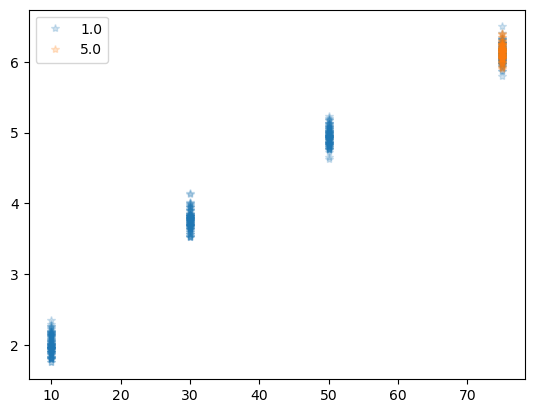

4.71238898038469


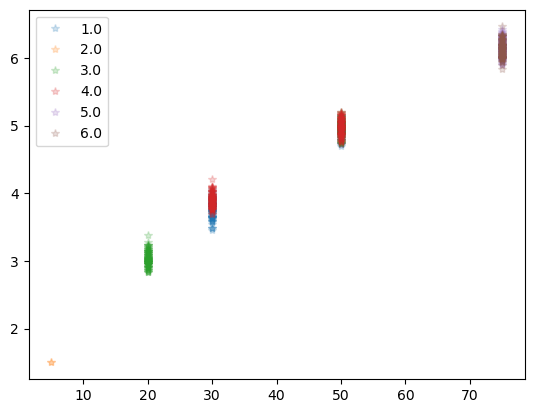

In [ ]:
%matplotlib inline
i=0
for angle in list_containing_simulated_data_sorted_by_angles.keys():
    subset_given_angle= list_containing_simulated_data_sorted_by_angles[angle][0]
    print(angle)
    for simulation_data in subset_given_angle:
        plt.plot(simulation_data['group_size'],
                    simulation_data['group_diameter'], 
                '*',label=simulation_data["focal_bat"][0][0],alpha=0.2)
        i+=1
    plt.legend()
    plt.show()

In [ ]:
simulation_data.keys()

Index(['nbrs_detected', 'group_size', 'group_diameter',
       'nearest_neighbour_distance', 'nbrs_detected_distance', 'uuid', 'seed',
       'paramset_id', 'parameters_joint', 'echo_levels', 'detection_azimuth',
       'heading_variation', 'echocall_duration', 'atmospheric_attenuation',
       'min_spacing', 'source_level', 'interpulse_interval',
       'implement_shadowing', 'focal_bat'],
      dtype='object')

In [ ]:
by_minspacing = simulation_data.groupby('min_spacing')
nearest_nbr_dist = {}
for spacing, df in by_minspacing:
    nearest_nbr_distances = df['nearest_neighbour_distance'].reset_index(drop=True)
    nearest_nbr_dist[spacing] = np.concatenate(nearest_nbr_distances)
nearest_nbr_dists_for_plot = [nearest_nbr_dist[0.5]]

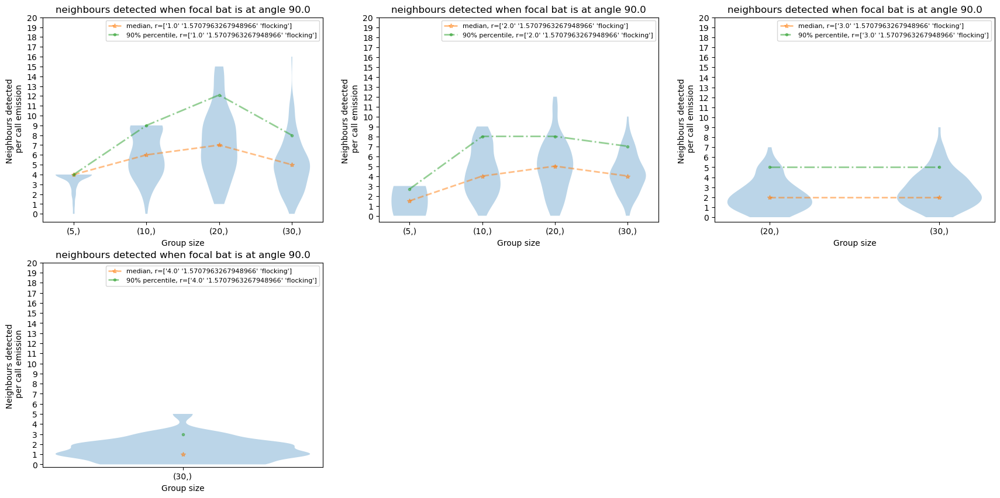

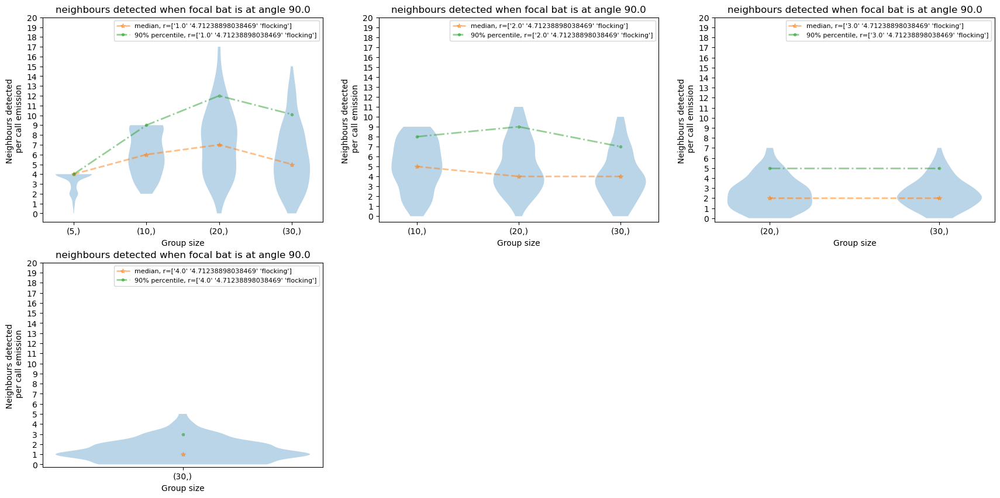

In [ ]:
iterant1_axis=0
# fig, axs = plt.subplots(1,3, figsize=(27,9))


for angle in list_containing_simulated_data_sorted_by_angles.keys():
        subset_given_angle= list_containing_simulated_data_sorted_by_angles[angle][0]; iterant2_color=0
        
        plt.figure(figsize=(21,10))
        i=1
        for simulation_data in subset_given_angle:
                data_by_groupsize = simulation_data.groupby(['group_size'])
                nbrs_detected_data = {}
                nbrs_detected_data['num_nbrs'] = []
                nbrs_detected_data['median_num_nbrs'] = []
                nbrs_detected_data['90%ile_num_nbrs'] = []
                groupsizes= []
                for groupsize, dataframe in data_by_groupsize:
                        groupsizes.append(groupsize)
                        nbrs_detected_data['num_nbrs'].append(np.array(dataframe['nbrs_detected']))
                        nbrs_detected_data['median_num_nbrs'].append(np.median(np.array(dataframe['nbrs_detected'])))
                        nbrs_detected_data['90%ile_num_nbrs'].append(np.percentile(np.array(dataframe['nbrs_detected']), 90))

                breakup_x_axis  = np.arange(1,len(groupsizes)+1)+0.5
                nbrs_detected_data['median_num_nbrs']

                # plt.figure(figsize=(7,3.42))
                plt.subplot(2,3,i)
                plt.violinplot(nbrs_detected_data['num_nbrs'][:], showextrema=False)
                plt.plot(np.arange(1,len(groupsizes)+1),nbrs_detected_data['median_num_nbrs'][:],
                        '--*',linewidth=2, alpha=0.5,label="median, r="+str(simulation_data["focal_bat"][0]))#'median')
                # print(np.arange(1,len(groupsizes)))
                plt.plot(np.arange(1,len(groupsizes)+1), nbrs_detected_data['90%ile_num_nbrs'][:],
                        '-..',linewidth=2, alpha=0.5, label="90% percentile, r="+str(simulation_data["focal_bat"][0]))#label='90%ile')
                # plt.vlines(breakup_x_axis, -1,20, 'w',linewidth=30,alpha=1.0)
                plt.yticks(np.arange(0,21,1))
                plt.xticks(range(1,len(groupsizes)+1),groupsizes[:])
                plt.legend(fontsize=8)
                plt.ylabel('Neighbours detected \n per call emission', fontsize=10)
                plt.xlabel('Group size', fontsize=10)
                # # plt.ylim(0,20)

                # axs[i].tight_layout()
                plt.title("neighbours detected when focal bat is at angle "+str(np.degrees(np.pi/2)))
                iterant2_color+=1; i+=1
                
        iterant1_axis+=1
                # plt.savefig('Figure2_groupsize_1200dpi.pdf',
                #         bbox_inches='tight', pad_inches=0.05, format='pdf', dpi=1200)
        
        # print(groupsizes); print(nbrs_detected_data['median_num_nbrs'])

In [ ]:
store_info[10]

[     nbrs_detected  group_size  group_diameter  \
 0                1          50        4.981982   
 1                6          30        3.946143   
 2                3           5        1.036136   
 3                2          75        6.192973   
 4                8          10        2.002688   
 ..             ...         ...             ...   
 595              5          10        1.943582   
 596              2          50        4.839177   
 597              2           5        1.200109   
 598              1          20        2.878849   
 599              9          10        2.060233   
 
                             nearest_neighbour_distance  \
 0    [0.5076035912419788, 0.6218724544540727, 0.723...   
 1    [0.5107568558491086, 0.5196964536957928, 0.589...   
 2    [0.5469686704053571, 0.6959014348986038, 1.004...   
 3    [0.5267014784423539, 0.5412405256680821, 0.579...   
 4    [0.5055593736512486, 0.5069042955012203, 0.570...   
 ..                             

0
[[1.         1.57079633 0.        ]
 [1.         4.71238898 0.        ]
 [2.         1.57079633 0.        ]
 [2.         4.71238898 0.        ]
 [3.         1.57079633 0.        ]
 [3.         4.71238898 0.        ]
 [4.         1.57079633 0.        ]
 [4.         4.71238898 0.        ]
 [5.         1.57079633 0.        ]
 [5.         4.71238898 0.        ]
 [6.         1.57079633 0.        ]
 [6.         4.71238898 0.        ]]
[1.57079633 4.71238898]
0
2
4
6
8
10
1
3
5
7
9
11
1.5707963267948966


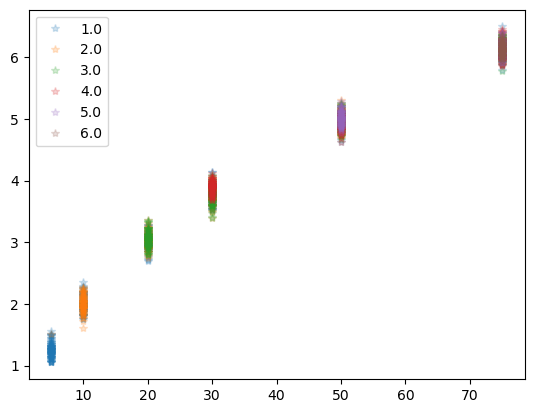

4.71238898038469


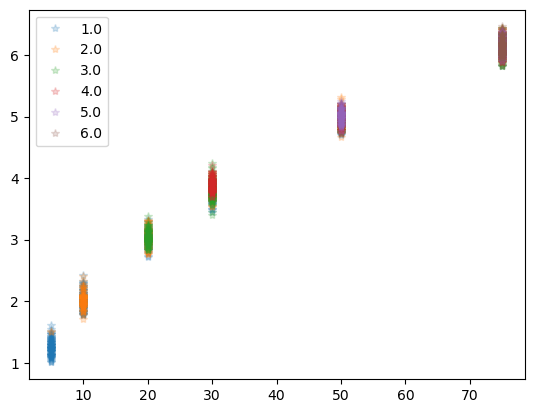

10
[[ 1.          1.57079633 10.        ]
 [ 1.          4.71238898 10.        ]
 [ 2.          1.57079633 10.        ]
 [ 2.          4.71238898 10.        ]
 [ 3.          1.57079633 10.        ]
 [ 3.          4.71238898 10.        ]
 [ 4.          1.57079633 10.        ]
 [ 4.          4.71238898 10.        ]
 [ 5.          1.57079633 10.        ]
 [ 5.          4.71238898 10.        ]
 [ 6.          1.57079633 10.        ]
 [ 6.          4.71238898 10.        ]]
[1.57079633 4.71238898]
0
2
4
6
8
10
1
3
5
7
9
11
1.5707963267948966


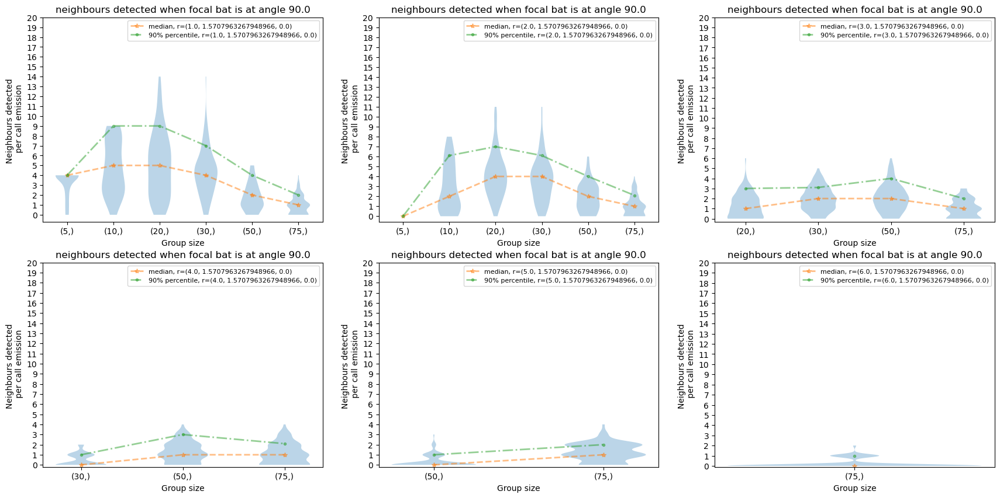

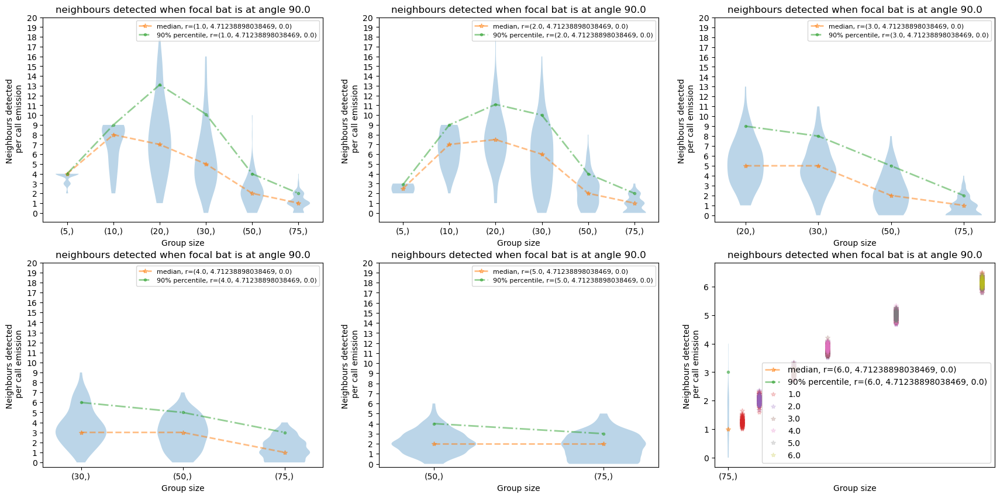

4.71238898038469


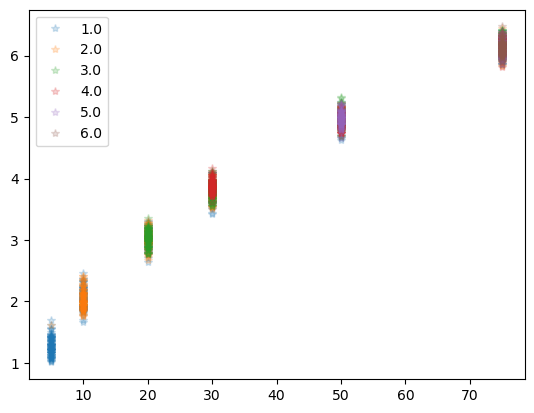

30
[[ 1.          1.57079633 30.        ]
 [ 1.          4.71238898 30.        ]
 [ 2.          1.57079633 30.        ]
 [ 2.          4.71238898 30.        ]
 [ 3.          1.57079633 30.        ]
 [ 3.          4.71238898 30.        ]
 [ 4.          1.57079633 30.        ]
 [ 4.          4.71238898 30.        ]
 [ 5.          1.57079633 30.        ]
 [ 5.          4.71238898 30.        ]
 [ 6.          1.57079633 30.        ]
 [ 6.          4.71238898 30.        ]]
[1.57079633 4.71238898]
0
2
4
6
8
10
1
3
5
7
9
11
1.5707963267948966


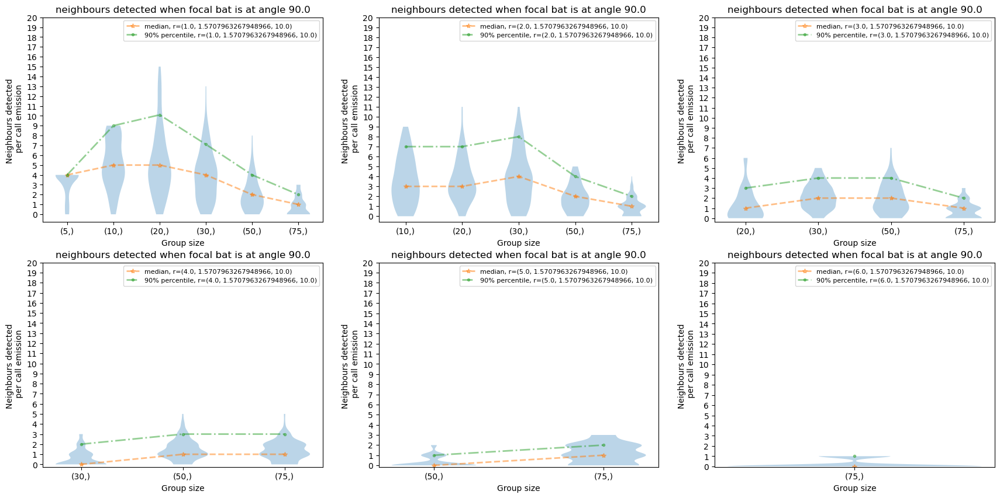

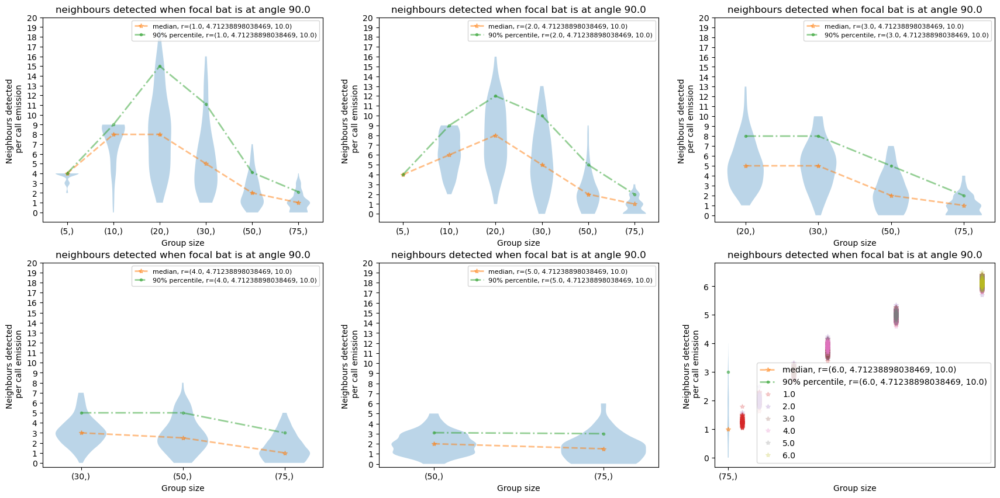

4.71238898038469


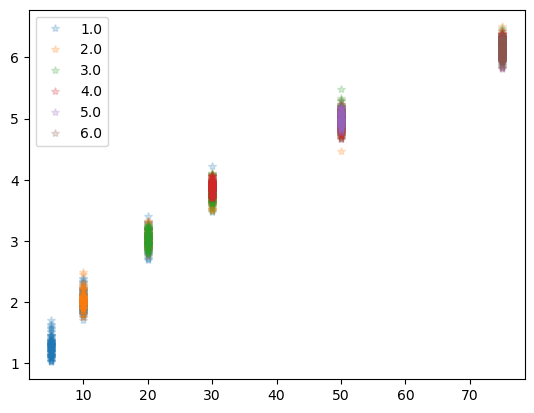

50
[[ 1.          1.57079633 50.        ]
 [ 1.          4.71238898 50.        ]
 [ 2.          1.57079633 50.        ]
 [ 2.          4.71238898 50.        ]
 [ 3.          1.57079633 50.        ]
 [ 3.          4.71238898 50.        ]
 [ 4.          1.57079633 50.        ]
 [ 4.          4.71238898 50.        ]
 [ 5.          1.57079633 50.        ]
 [ 5.          4.71238898 50.        ]
 [ 6.          1.57079633 50.        ]
 [ 6.          4.71238898 50.        ]]
[1.57079633 4.71238898]
0
2
4
6
8
10
1
3
5
7
9
11
1.5707963267948966


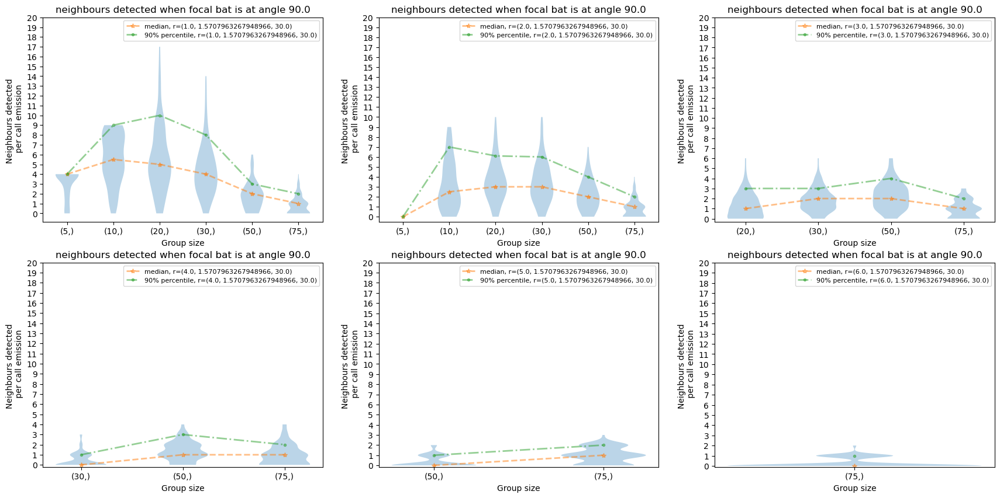

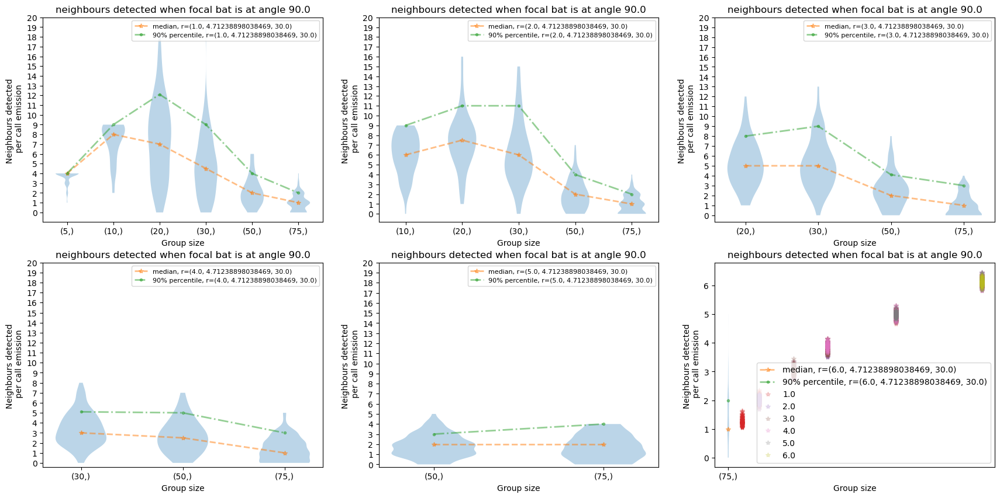

4.71238898038469


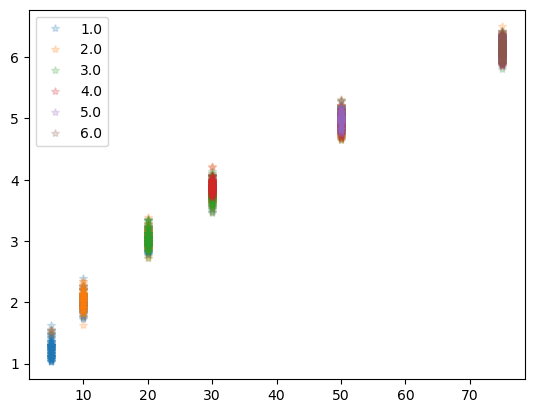

flocking
[['1.0' '1.5707963267948966' 'flocking']
 ['1.0' '4.71238898038469' 'flocking']
 ['2.0' '1.5707963267948966' 'flocking']
 ['2.0' '4.71238898038469' 'flocking']
 ['3.0' '1.5707963267948966' 'flocking']
 ['3.0' '4.71238898038469' 'flocking']
 ['4.0' '1.5707963267948966' 'flocking']
 ['4.0' '4.71238898038469' 'flocking']
 ['5.0' '1.5707963267948966' 'flocking']
 ['5.0' '4.71238898038469' 'flocking']
 ['6.0' '1.5707963267948966' 'flocking']
 ['6.0' '4.71238898038469' 'flocking']]
['1.5707963267948966' '4.71238898038469']
0
2
4
6
8
10
1
3
5
7
9
11
1.5707963267948966


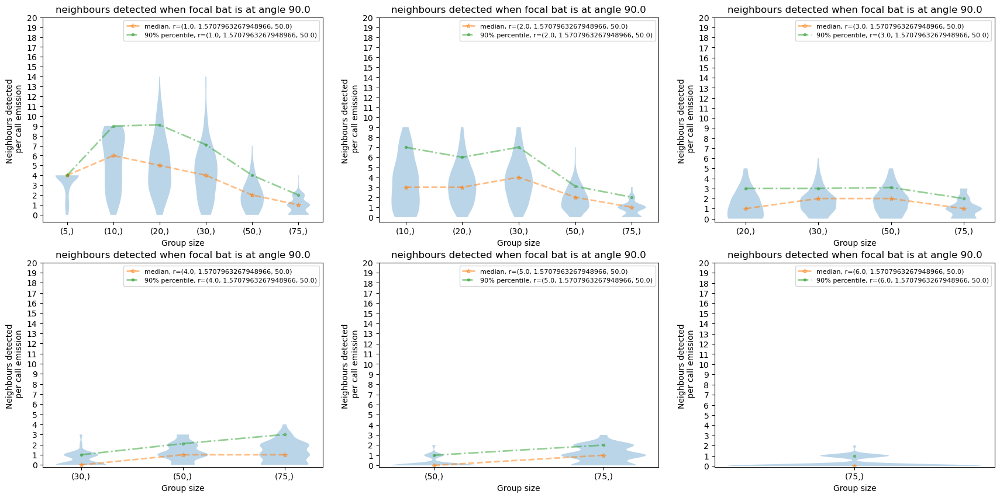

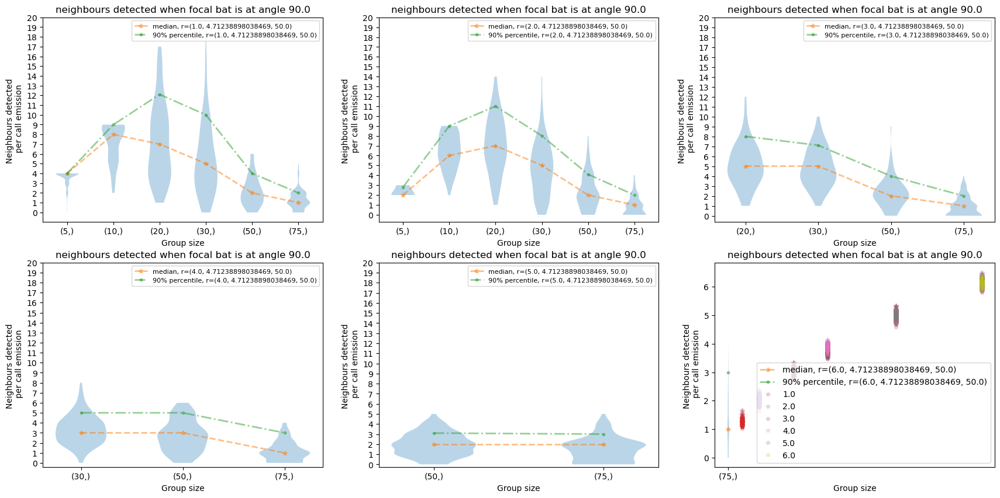

4.71238898038469


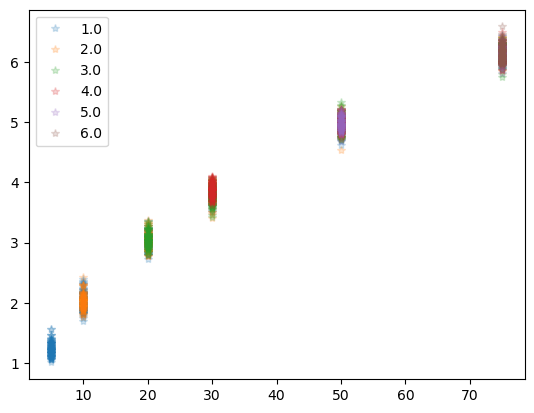

swarming
[['1.0' '1.5707963267948966' 'swarming']
 ['1.0' '4.71238898038469' 'swarming']
 ['2.0' '1.5707963267948966' 'swarming']
 ['2.0' '4.71238898038469' 'swarming']
 ['3.0' '1.5707963267948966' 'swarming']
 ['3.0' '4.71238898038469' 'swarming']
 ['4.0' '1.5707963267948966' 'swarming']
 ['4.0' '4.71238898038469' 'swarming']
 ['5.0' '1.5707963267948966' 'swarming']
 ['5.0' '4.71238898038469' 'swarming']
 ['6.0' '1.5707963267948966' 'swarming']
 ['6.0' '4.71238898038469' 'swarming']]
['1.5707963267948966' '4.71238898038469']
0
2
4
6
8
10
1
3
5
7
9
11
1.5707963267948966


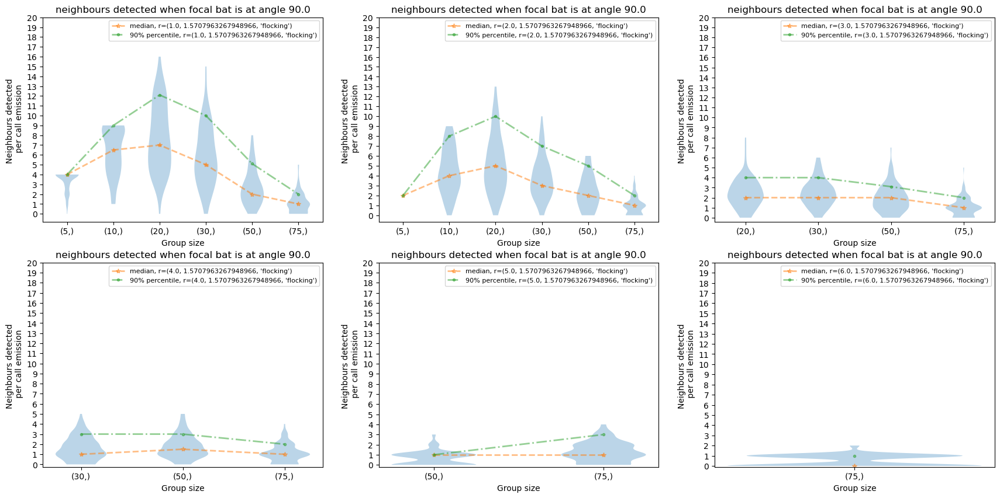

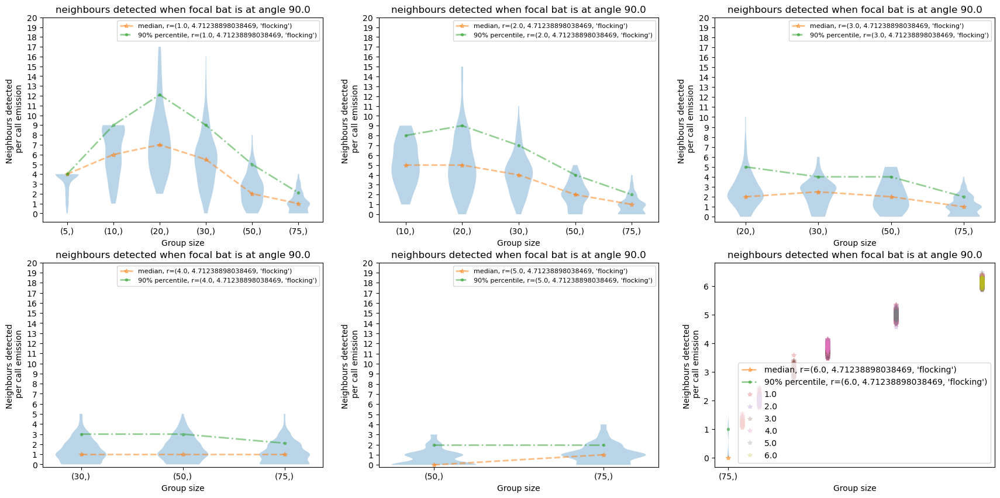

4.71238898038469


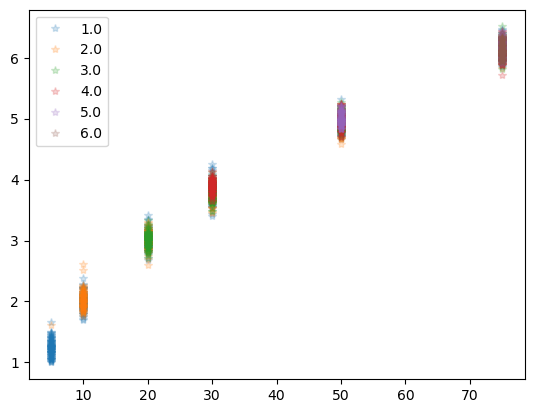

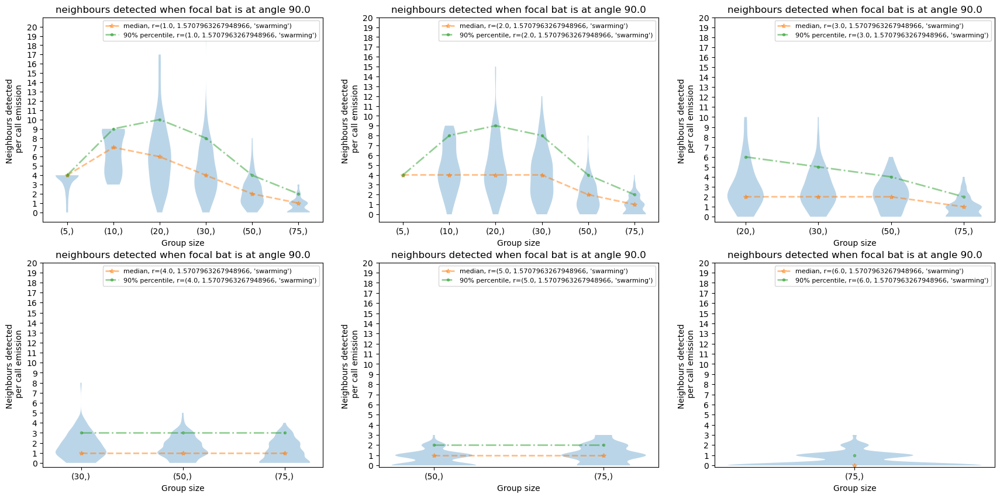

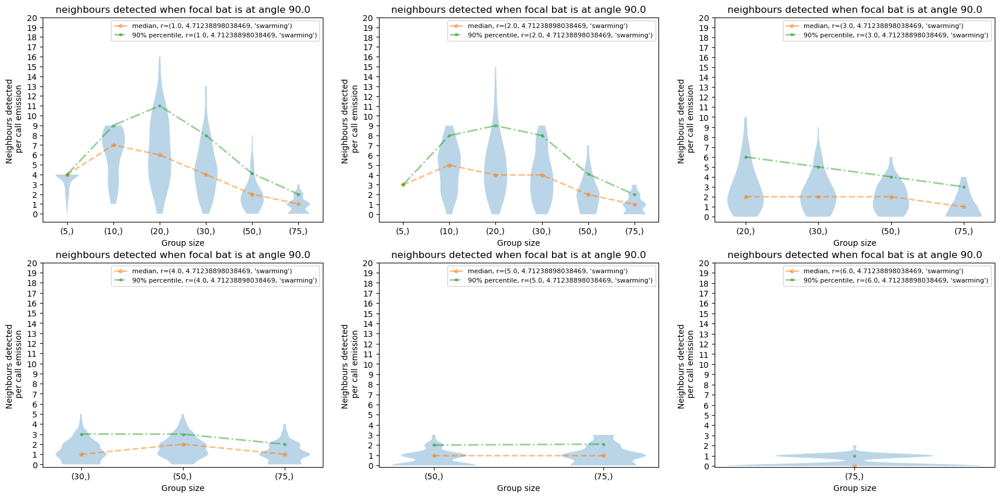

In [199]:
store_info_cleaned= {}
subset= [0,10,30,50, "flocking", "swarming"]
for key in subset:
    print(key)
    array_containing_all_simulation_datasets_raw= store_info[key]
    array_containing_all_simulation_datasets=[]
    array_containing_labels= []
    for simulation_data in array_containing_all_simulation_datasets_raw:
        try:
            if simulation_data["focal_bat"][0][2]==key:
                array_containing_all_simulation_datasets.append(simulation_data)
                array_containing_labels.append(simulation_data["focal_bat"][0])
        except KeyError:
            continue
    store_info_cleaned[key]= array_containing_all_simulation_datasets
    array_containing_labels= np.array(array_containing_labels)

    print(array_containing_labels)

    unique_angles_in_dataset= np.unique(array_containing_labels[:,1])
    list_containing_simulated_data_sorted_by_angles= {}
    print(unique_angles_in_dataset)
    for angle in unique_angles_in_dataset:
        list_containing_simulated_data_sorted_by_angles[angle]= []
        sublist_true_false_labels= array_containing_labels[:,1]==angle
        sublist_given_angle= passing_true_false_indices_through_lists(array_containing_all_simulation_datasets, sublist_true_false_labels)
        list_containing_simulated_data_sorted_by_angles[angle].append(sublist_given_angle)
    %matplotlib inline
    i=0
    for angle in list_containing_simulated_data_sorted_by_angles.keys():
        subset_given_angle= list_containing_simulated_data_sorted_by_angles[angle][0]
        print(angle)
        for simulation_data in subset_given_angle:
            plt.plot(simulation_data['group_size'],
                        simulation_data['group_diameter'], 
                    '*',label=simulation_data["focal_bat"][0][0],alpha=0.2)
            i+=1
        plt.legend()
        plt.show()
    iterant1_axis=0
    # fig, axs = plt.subplots(1,3, figsize=(27,9))


    for angle in list_containing_simulated_data_sorted_by_angles.keys():
            subset_given_angle= list_containing_simulated_data_sorted_by_angles[angle][0]; iterant2_color=0
            colors=["blue", "red", "green", "black"]
            plt.figure(figsize=(21,10))
            i=1
            for simulation_data in subset_given_angle:
                    data_by_groupsize = simulation_data.groupby(['group_size'])
                    nbrs_detected_data = {}
                    nbrs_detected_data['num_nbrs'] = []
                    nbrs_detected_data['median_num_nbrs'] = []
                    nbrs_detected_data['90%ile_num_nbrs'] = []
                    groupsizes= []
                    for groupsize, dataframe in data_by_groupsize:
                            groupsizes.append(groupsize)
                            nbrs_detected_data['num_nbrs'].append(np.array(dataframe['nbrs_detected']))
                            nbrs_detected_data['median_num_nbrs'].append(np.median(np.array(dataframe['nbrs_detected'])))
                            nbrs_detected_data['90%ile_num_nbrs'].append(np.percentile(np.array(dataframe['nbrs_detected']), 90))

                    breakup_x_axis  = np.arange(1,len(groupsizes)+1)+0.5
                    nbrs_detected_data['median_num_nbrs']

                    # plt.figure(figsize=(7,3.42))
                    plt.subplot(2,3,i)
                    plt.violinplot(nbrs_detected_data['num_nbrs'][:], showextrema=False)
                    plt.plot(np.arange(1,len(groupsizes)+1),nbrs_detected_data['median_num_nbrs'][:],
                            '--*',linewidth=2, alpha=0.5,label="median, r="+str(simulation_data["focal_bat"][0]))#'median')
                    # print(np.arange(1,len(groupsizes)))
                    plt.plot(np.arange(1,len(groupsizes)+1), nbrs_detected_data['90%ile_num_nbrs'][:],
                            '-..',linewidth=2, alpha=0.5, label="90% percentile, r="+str(simulation_data["focal_bat"][0]))#label='90%ile')
                    # plt.vlines(breakup_x_axis, -1,20, 'w',linewidth=30,alpha=1.0)
                    plt.yticks(np.arange(0,21,1))
                    plt.xticks(range(1,len(groupsizes)+1),groupsizes[:])
                    plt.legend(fontsize=8)
                    plt.ylabel('Neighbours detected \n per call emission', fontsize=10)
                    plt.xlabel('Group size', fontsize=10)
                    # # plt.ylim(0,20)

                    # axs[i].tight_layout()
                    plt.title("neighbours detected when focal bat is at angle "+str(np.degrees(np.pi/2)))
                    iterant2_color+=1; i+=1
                    
            iterant1_axis+=1
                    # plt.savefig('Figure2_groupsize_1200dpi.pdf',
                    #         bbox_inches='tight', pad_inches=0.05, format='pdf', dpi=1200)
            
            # print(groupsizes); print(nbrs_detected_data['median_num_nbrs'])

# Verticle transect

moving from $(0.75, \frac {3pi}{2})$ to $(0.75, \frac {pi}{2})$ [r, theta] is similar to moving in a ($x=0$) transect centered at the centermost bat.
Note: All the heading vectors are in 90 degree direction ( $\pm$ 10 degree)

In [200]:
tuple([1,1,1])

(1, 1, 1)

In [201]:
key= "swarming"
transect_subsets= [[6.0, 3*np.pi/2, key],[5.0, 3*np.pi/2, key],[4.0, 3*np.pi/2, key],[3.0, 3*np.pi/2, key],[2.0, 3*np.pi/2, key],[1.0, 3*np.pi/2, key],[1.0, np.pi/2, key],[2.0, np.pi/2, key], [3.0, np.pi/2, key], [4.0, np.pi/2, key], [5.0, np.pi/2, key], [6.0, np.pi/2, key]]
transect_subsets= [tuple(i) for i in transect_subsets]
iterant_transect=0
sublist_of_simulation_data_intransect=[]
for r_theta in transect_subsets:
    for simulation_data in array_containing_all_simulation_datasets:
        if simulation_data["focal_bat"][0]==r_theta:
            sublist_of_simulation_data_intransect.append(simulation_data)    

sign_based_on_distance_from_centermost_point= [-1, -1, -1, -1, -1, -1, 1, 1, 1, 1, 1, 1]     
group_sizes= [5,10,20,30,50,75]

In [203]:
sublist_of_simulation_data_intransect_across_heading_var= {}

for heading_var in group_heading_variation:
    sublist_of_simulation_data_intransect=[]
    array_containing_all_simulation_datasets= store_info_cleaned[heading_var]
    key= heading_var
    transect_subsets= [[6.0, 3*np.pi/2, key],[5.0, 3*np.pi/2, key],[4.0, 3*np.pi/2, key],[3.0, 3*np.pi/2, key],[2.0, 3*np.pi/2, key],[1.0, 3*np.pi/2, key],[1.0, np.pi/2, key],[2.0, np.pi/2, key], [3.0, np.pi/2, key], [4.0, np.pi/2, key], [5.0, np.pi/2, key], [6.0, np.pi/2, key]]
    transect_subsets= [tuple(i) for i in transect_subsets]

    for r_theta in transect_subsets:
        for simulation_data in array_containing_all_simulation_datasets:
            if simulation_data["focal_bat"][0]==r_theta:
                sublist_of_simulation_data_intransect.append(simulation_data)    
    sublist_of_simulation_data_intransect_across_heading_var[heading_var]= sublist_of_simulation_data_intransect

In [204]:
sublist_of_simulation_data_intransect_across_heading_var[10]

[    nbrs_detected  group_size  group_diameter  \
 0               2          75        6.006471   
 1               1          75        6.151556   
 2               1          75        6.006108   
 3               1          75        6.212422   
 4               3          75        6.214739   
 ..            ...         ...             ...   
 95              2          75        6.059763   
 96              1          75        6.202057   
 97              0          75        6.188664   
 98              1          75        6.335666   
 99              2          75        6.119356   
 
                            nearest_neighbour_distance  \
 0   [0.5490648763811092, 0.6913576503403807, 0.739...   
 1   [0.6025770331279539, 0.7593579885085383, 0.771...   
 2   [0.6830701272679425, 0.7713317881488884, 0.773...   
 3   [0.5625949477821244, 0.5856992595628759, 0.616...   
 4   [0.5246475058045458, 0.5447650319281616, 0.826...   
 ..                                               

In [57]:
len(sublist_of_simulation_data_intransect)

12

In [58]:
array_containing_all_simulation_datasets[1]["focal_bat"][0]==[1.0, 3*np.pi/2, key]
float(simulation_data["focal_bat"][0][1])

4.71238898038469

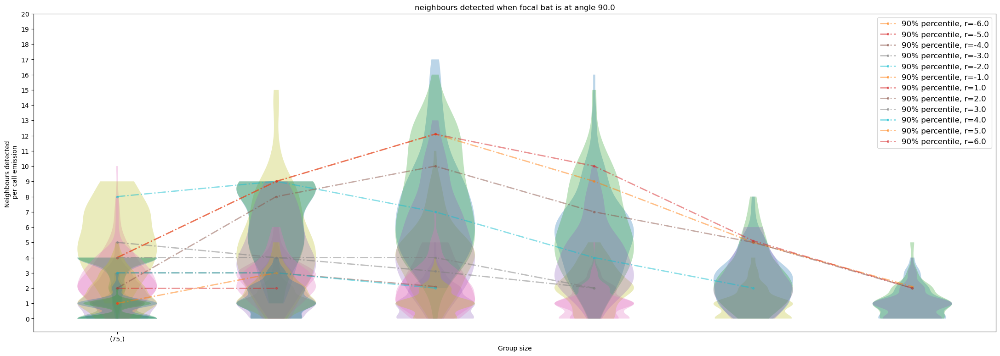

In [205]:
colors=["blue", "red", "green", "black", "pink", "cyan", "yellow"]

fig, axs = plt.subplots(1,1, figsize=(27,9))
iterant2_color=0
for simulation_data in sublist_of_simulation_data_intransect:
        data_by_groupsize = simulation_data.groupby(['group_size'])
        nbrs_detected_data = {}
        nbrs_detected_data['num_nbrs'] = []
        nbrs_detected_data['median_num_nbrs'] = []
        nbrs_detected_data['90%ile_num_nbrs'] = []
        groupsizes= []
        for groupsize, dataframe in data_by_groupsize:
                groupsizes.append(groupsize)
                nbrs_detected_data['num_nbrs'].append(np.array(dataframe['nbrs_detected']))
                nbrs_detected_data['median_num_nbrs'].append(np.median(np.array(dataframe['nbrs_detected'])))
                nbrs_detected_data['90%ile_num_nbrs'].append(np.percentile(np.array(dataframe['nbrs_detected']), 90))

        breakup_x_axis  = np.arange(1,len(groupsizes)+1)+0.5
        nbrs_detected_data['median_num_nbrs']

        # plt.figure(figsize=(7,3.42))
        # plt.subplot(1,2,i)
        
        axs.violinplot(nbrs_detected_data['num_nbrs'][:], showextrema=False)
        # axs.plot(np.arange(1,len(groupsizes)+1),nbrs_detected_data['median_num_nbrs'][:],
        #         '--*',linewidth=2, alpha=0.5,label="median, r="+str(sign_based_on_distance_from_centermost_point[iterant2_color]*simulation_data["focal_bat"][0][0]), 
        #         color= colors[iterant2_color])#'median')
        # print(np.arange(1,len(groupsizes)))
        axs.plot(np.arange(1,len(groupsizes)+1), nbrs_detected_data['90%ile_num_nbrs'][:],
                '-..',linewidth=2, alpha=0.5, label="90% percentile, r="+str(sign_based_on_distance_from_centermost_point[iterant2_color]*simulation_data["focal_bat"][0][0])
                )#label='90%ile')
        # plt.vlines(breakup_x_axis, -1,20, 'w',linewidth=30,alpha=1.0)
        axs.set_yticks(np.arange(0,21,1))
        axs.set_xticks(range(1,len(groupsizes)+1),groupsizes[:])
        axs.legend(fontsize=12)
        axs.set_ylabel('Neighbours detected \n per call emission', fontsize=10)
        axs.set_xlabel('Group size', fontsize=10)
        # # plt.ylim(0,20)

        # axs[i].tight_layout()
        axs.set_title("neighbours detected when focal bat is at angle "+str(np.degrees(float(simulation_data["focal_bat"][0][1]))))
        iterant2_color+=1
plt.show()

separate the violin plots out for different group sizes to see clear differences between distance from center


/tmp/ipykernel_224483/2569770723.py:19: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  dataframe = simulation_data.groupby(['group_size']).get_group(group_size)
/tmp/ipykernel_224483/2569770723.py:19: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  dataframe = simulation_data.groupby(['group_size']).get_group(group_size)
/tmp/ipykernel_224483/2569770723.py:19: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  dataframe = simulation_data.groupby(['group_size']).get_group(group_size)
/tmp/ipykernel_224483/2569770723.py:19: FutureWarning: When g

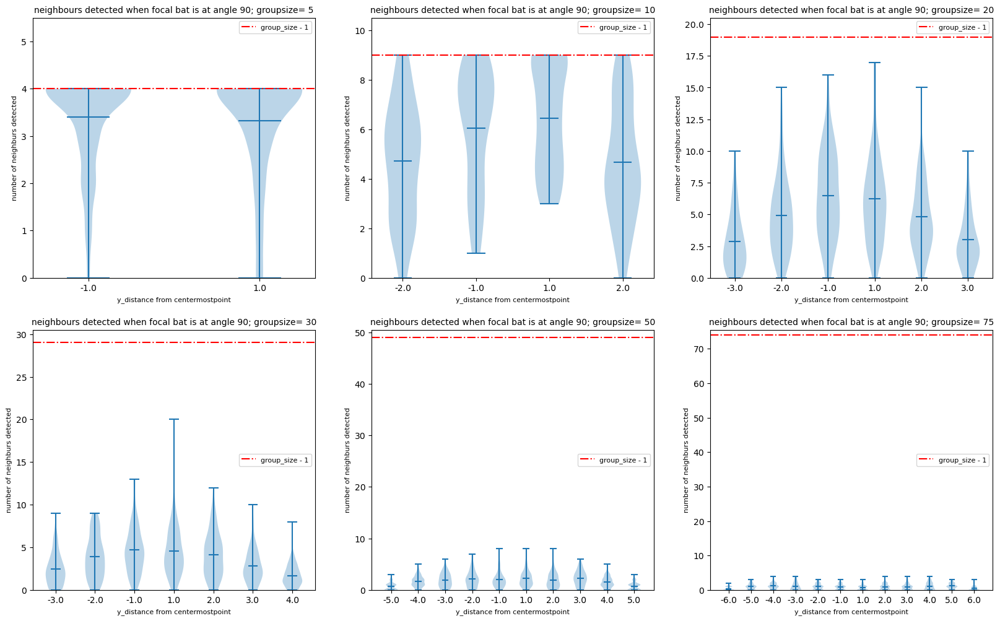

In [210]:
colors=["blue", "red", "green", "black", "pink", "cyan", "yellow"]

# fig, axs = plt.subplots(1,1, figsize=(27,9))
i=0; 
number_of_columns=3; number_of_rows= int(np.ceil(len(group_sizes)/number_of_columns))
plt.figure(figsize=(20,12))
sublist_of_simulation_data_intransect= sublist_of_simulation_data_intransect_across_heading_var["swarming"]
for group_size in group_sizes:
    nbrs_detected_data = {}
    nbrs_detected_data['num_nbrs'] = []
    nbrs_detected_data['median_num_nbrs'] = []
    nbrs_detected_data['90%ile_num_nbrs'] = []
    
    x_ticks= []; iterant_sign=-1
    for simulation_data in sublist_of_simulation_data_intransect:
        iterant_sign+=1

        try:
            dataframe = simulation_data.groupby(['group_size']).get_group(group_size)    
            if len(dataframe["nbrs_detected"])!=100:
                continue
            nbrs_detected_data['num_nbrs'].append(np.array(dataframe['nbrs_detected']))
            nbrs_detected_data['median_num_nbrs'].append(np.median(np.array(dataframe['nbrs_detected'])))
            nbrs_detected_data['90%ile_num_nbrs'].append(np.percentile(np.array(dataframe['nbrs_detected']), 90))    
        except KeyError:
            continue
        x_ticks.append(sign_based_on_distance_from_centermost_point[iterant_sign]*simulation_data["focal_bat"][0][0])
    

    plt.subplot(number_of_rows,number_of_columns,i+1)
    plt.violinplot(nbrs_detected_data['num_nbrs'], showmeans=True)
    # plt.boxplot(nbrs_detected_data['num_nbrs'], showmeans=True)
    plt.title(f"neighbours detected when focal bat is at angle {90}; groupsize= {group_size}", fontsize= "10")
    plt.xticks(np.arange(1,len(x_ticks)+1),x_ticks)
    # plt.show()
    plt.ylim(0,group_size+0.5)
    plt.axhline(group_size-1, ls="-.", color="red", label= "group_size - 1")
    plt.xlabel("y_distance from centermostpoint", fontsize= "8")
    plt.ylabel("number of neighburs detected", fontsize= "8")
    plt.legend(fontsize= "8")

    i+=1

Zooming into the plots to see finer differences between the diffrent violin plots

/tmp/ipykernel_224483/2747149107.py:17: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  dataframe = simulation_data.groupby(['group_size']).get_group(group_size)
/tmp/ipykernel_224483/2747149107.py:17: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  dataframe = simulation_data.groupby(['group_size']).get_group(group_size)
/tmp/ipykernel_224483/2747149107.py:17: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  dataframe = simulation_data.groupby(['group_size']).get_group(group_size)
/tmp/ipykernel_224483/2747149107.py:17: FutureWarning: When g

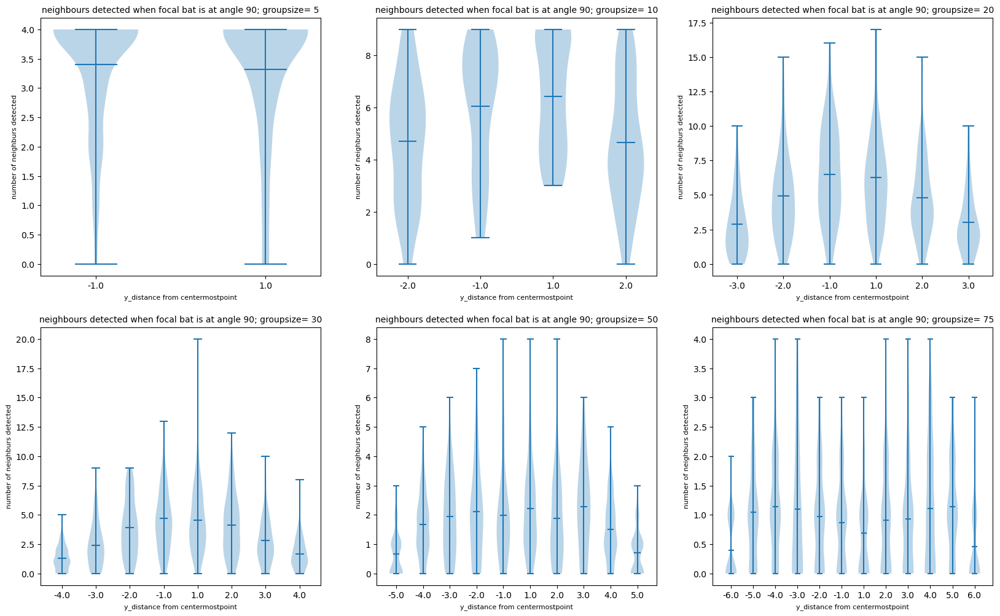

In [61]:
colors=["blue", "red", "green", "black", "pink", "cyan", "yellow"]

# fig, axs = plt.subplots(1,1, figsize=(27,9))
i=0; 
number_of_columns=3; number_of_rows= int(np.ceil(len(group_sizes)/number_of_columns))
plt.figure(figsize=(20,12))
for group_size in group_sizes:
    nbrs_detected_data = {}
    nbrs_detected_data['num_nbrs'] = []
    nbrs_detected_data['median_num_nbrs'] = []
    nbrs_detected_data['90%ile_num_nbrs'] = []
    
    x_ticks= []; iterant_sign=-1
    for simulation_data in sublist_of_simulation_data_intransect:
        iterant_sign+=1
        try:
            dataframe = simulation_data.groupby(['group_size']).get_group(group_size)    
            if len(dataframe["nbrs_detected"])<90:
                continue
            nbrs_detected_data['num_nbrs'].append(np.array(dataframe['nbrs_detected']))
            nbrs_detected_data['median_num_nbrs'].append(np.median(np.array(dataframe['nbrs_detected'])))
            nbrs_detected_data['90%ile_num_nbrs'].append(np.percentile(np.array(dataframe['nbrs_detected']), 90))    
        except KeyError:
            continue
        x_ticks.append(sign_based_on_distance_from_centermost_point[iterant_sign]*simulation_data["focal_bat"][0][0])

        

    plt.subplot(number_of_rows,number_of_columns,i+1)
    plt.violinplot(nbrs_detected_data['num_nbrs'], showmeans=True)
    # plt.boxplot(nbrs_detected_data['num_nbrs'], showmeans=True)
    plt.title(f"neighbours detected when focal bat is at angle {90}; groupsize= {group_size}", fontsize= "10")
    plt.xticks(np.arange(1,len(x_ticks)+1),x_ticks)
    # plt.show()
    # plt.ylim(0,group_size+0.5)
    # plt.axhline(group_size-1, ls="-.", color="red", label= "group_size - 1")
    plt.xlabel("y_distance from centermostpoint", fontsize= "8")
    plt.ylabel("number of neighburs detected", fontsize= "8")
    # plt.legend(fontsize= "8")

    i+=1

The number of neighbours detected shows an increase with group size initially and then drops sharply down beyond 30 bats. 


### How does the probability of detecting at least one neighbour change with group size?

In [62]:
def calculate_geqNneighbour(num_detected_neighbours, N):
    '''Calculates the proportion of an array-like
    object that is >= N.
    
    '''
    geq_N = np.float64(np.sum(num_detected_neighbours>=N))
    if np.isnan(np.min(num_detected_neighbours)):
        return np.nan
    proportion_geq_N = geq_N/len(num_detected_neighbours)
    return(proportion_geq_N)

In [63]:
simulation_data.keys()

Index(['nbrs_detected', 'group_size', 'group_diameter',
       'nearest_neighbour_distance', 'nbrs_detected_distance', 'uuid', 'seed',
       'paramset_id', 'parameters_joint', 'echo_levels', 'detection_azimuth',
       'heading_variation', 'echocall_duration', 'atmospheric_attenuation',
       'min_spacing', 'source_level', 'interpulse_interval',
       'implement_shadowing', 'focal_bat'],
      dtype='object')

In [211]:
#store data
store_nbrs_across_heading_var= {} #key is heading var
for heading_var in group_heading_variation:
        store_probability_of_detection_n_neighbour= {}
        group_sizes= [5,10,20,30,50,75]
        i=0
        sublist_of_simulation_data_intransect= sublist_of_simulation_data_intransect_across_heading_var[heading_var]
        for simulation_data in sublist_of_simulation_data_intransect:
                data_by_groupsize = simulation_data.groupby(['group_size'])

                nbrs_detected_data = {}
                nbrs_detected_data["group_sizes"]= group_sizes
                nbrs_detected_data['num_nbrs'] = []
                nbrs_detected_data['median_num_nbrs'] = []
                nbrs_detected_data['90%ile_num_nbrs'] = []
                nbrs_detected_data['detected_distances'] = []
                nbrs_detected_data['neighbours_azimuth'] = []
                nbrs_detected_data['echolevels'] = []
                groupsizes= []

                for groupsize, dataframe in data_by_groupsize:
                        if len(dataframe)<99:
                                print(len(dataframe))
                                continue
                        groupsizes.append(groupsize[0])
                        nbrs_detected_data['num_nbrs'].append(np.array(dataframe['nbrs_detected']))
                        nbrs_detected_data['median_num_nbrs'].append(np.median(np.array(dataframe['nbrs_detected'])))
                        nbrs_detected_data['90%ile_num_nbrs'].append(np.percentile(np.array(dataframe['nbrs_detected']), 90))

                        nbrs_detected_data['detected_distances'].append(np.concatenate(np.array(dataframe['nbrs_detected_distance'])))

                        nbrs_detected_data['neighbours_azimuth'].append(np.concatenate(np.array(dataframe['detection_azimuth'])))

                        nbrs_detected_data['echolevels'].append(np.concatenate(np.array(dataframe['echo_levels'])))

                nan_groupsizes= [i for i in group_sizes if i not in groupsizes]

                for nan_groupsize in nan_groupsizes:
                        nbrs_detected_data['num_nbrs']= [np.nan, *nbrs_detected_data['num_nbrs']]
                        nbrs_detected_data['median_num_nbrs']= [np.nan, *nbrs_detected_data['median_num_nbrs']]
                        nbrs_detected_data['90%ile_num_nbrs']= [np.nan, *nbrs_detected_data['90%ile_num_nbrs']]

                nbrs_detected_data['0neighbours'] = [ 1-calculate_geqNneighbour(each,1)  for each in nbrs_detected_data['num_nbrs']]
                nbrs_detected_data['geq_1neighbour'] = [ calculate_geqNneighbour(each,1)  for each in nbrs_detected_data['num_nbrs']]
                nbrs_detected_data['geq_2neighbour'] = [ calculate_geqNneighbour(each,2)  for each in nbrs_detected_data['num_nbrs']]
                nbrs_detected_data['geq_3neighbour'] = [ calculate_geqNneighbour(each,3)  for each in nbrs_detected_data['num_nbrs']]
                nbrs_detected_data['geq_4neighbour'] = [ calculate_geqNneighbour(each,4)  for each in nbrs_detected_data['num_nbrs']]

                # nbrs_detected_data['detected_distances'] = [ np.concatenate(np.array(dataframe['nbrs_detected_distance'])) for groupsize, dataframe in data_by_groupsize]
                nbrs_detected_data['median_detected_distances'] = map(np.median, nbrs_detected_data['detected_distances'])
                nbrs_detected_data['90%ile_detected_distances'] = map(lambda X : np.percentile(X,90),
                                                                nbrs_detected_data['detected_distances'][:-1])

                # nbrs_detected_data['neighbours_azimuth'] = [ np.concatenate(np.array(dataframe['detection_azimuth'])) for groupsize, dataframe in data_by_groupsize]
                nbrs_detected_data['median_neighbours_azimuth'] = [ np.median(each)  for each in nbrs_detected_data['neighbours_azimuth'] ]
                nbrs_detected_data['95%ile_neighbours_azimuth'] = [ np.percentile(each, 97.5)  for each in nbrs_detected_data['neighbours_azimuth'][:-1] ]
                nbrs_detected_data['5%ile_neighbours_azimuth'] = [ np.percentile(each, 2.5)  for each in nbrs_detected_data['neighbours_azimuth'][:-1] ]

                # nbrs_detected_data['echolevels'] = [ np.concatenate(np.array(dataframe['echo_levels'])) for groupsize, dataframe in data_by_groupsize]
                nbrs_detected_data['median_echolevels'] = [ np.median(each) for each in nbrs_detected_data['echolevels']]
                nbrs_detected_data['5%ile_echolevels'] = [ np.percentile(each, 2.5) for each in nbrs_detected_data['echolevels'][:-1]]
                nbrs_detected_data['95%ile_echolevels'] = [ np.percentile(each, 97.5) for each in nbrs_detected_data['echolevels'][:-1]]

                for nan_groupsize in nan_groupsizes:
                        nbrs_detected_data['detected_distances']= [np.nan, *nbrs_detected_data['detected_distances']]
                        nbrs_detected_data['median_detected_distances']= [np.nan, *nbrs_detected_data['median_detected_distances']]
                        nbrs_detected_data['90%ile_detected_distances']= [np.nan, *nbrs_detected_data['90%ile_detected_distances']]

                        nbrs_detected_data['neighbours_azimuth']= [[np.nan], *nbrs_detected_data['neighbours_azimuth']]
                        nbrs_detected_data['median_neighbours_azimuth']= [np.nan, *nbrs_detected_data['median_neighbours_azimuth']]
                        nbrs_detected_data['5%ile_neighbours_azimuth']= [np.nan, *nbrs_detected_data['5%ile_neighbours_azimuth']]
                        nbrs_detected_data['95%ile_neighbours_azimuth']= [np.nan, *nbrs_detected_data['95%ile_neighbours_azimuth']]

                        nbrs_detected_data['echolevels']= [[np.nan], *nbrs_detected_data['echolevels']]
                        nbrs_detected_data['median_echolevels']= [np.nan, *nbrs_detected_data['median_echolevels']]
                        nbrs_detected_data['5%ile_echolevels']= [np.nan, *nbrs_detected_data['5%ile_echolevels']]
                        nbrs_detected_data['95%ile_echolevels']= [np.nan, *nbrs_detected_data['95%ile_echolevels']]
                        
                
                store_probability_of_detection_n_neighbour[simulation_data["focal_bat"][0][0]*sign_based_on_distance_from_centermost_point[i]]= nbrs_detected_data
                i+=1
        store_nbrs_across_heading_var[heading_var]= store_probability_of_detection_n_neighbour

2
1
1
1
3
1
1
1


In [212]:
store_nbrs_across_heading_var["flocking"]

{-6.0: {'group_sizes': [5, 10, 20, 30, 50, 75],
  'num_nbrs': [nan,
   nan,
   nan,
   nan,
   nan,
   array([0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1,
          1, 1, 1, 1, 0, 2, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0,
          1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1,
          0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1,
          1, 0, 0, 0, 0, 0, 0, 2, 1, 0, 1, 1])],
  'median_num_nbrs': [nan, nan, nan, nan, nan, np.float64(0.0)],
  '90%ile_num_nbrs': [nan, nan, nan, nan, nan, np.float64(1.0)],
  'detected_distances': [nan,
   nan,
   nan,
   nan,
   nan,
   array([0.63578546, 0.58518082, 0.58579685, 0.56047984, 0.73994231,
          0.65997563, 0.51996969, 0.60185078, 0.63794003, 0.67724586,
          0.55671536, 0.50376095, 0.64055851, 0.53702641, 0.5084076 ,
          0.58864802, 0.53480981, 0.78011995, 0.50242064, 0.70694527,
          0.58776315, 0.5028513 , 0.52118863, 0.63319586, 0.52074359,
     

In [191]:
store_nbrs_across_heading_var["swarming"]

{-6.0: {'group_sizes': [5, 10, 20, 30, 50, 75],
  'num_nbrs': [nan,
   nan,
   nan,
   nan,
   nan,
   array([0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1,
          0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1,
          1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 2, 0, 1, 1, 0,
          0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0,
          0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0])],
  'median_num_nbrs': [nan, nan, nan, nan, nan, np.float64(0.0)],
  '90%ile_num_nbrs': [nan, nan, nan, nan, nan, np.float64(1.0)],
  'detected_distances': [nan,
   nan,
   nan,
   nan,
   nan,
   array([0.50771068, 0.90115966, 0.54076344, 0.5473137 , 0.61949485,
          0.71394918, 0.58515067, 0.94623025, 0.50219351, 0.57017459,
          0.60080011, 0.60900886, 0.57705657, 0.62694038, 0.68525329,
          0.62315059, 0.50106944, 0.53003374, 0.55630798, 0.53585435,
          0.52740476, 0.59268599, 0.54281062, 0.75211819, 0.50943213,
     

In [214]:
heading_var= "flocking"

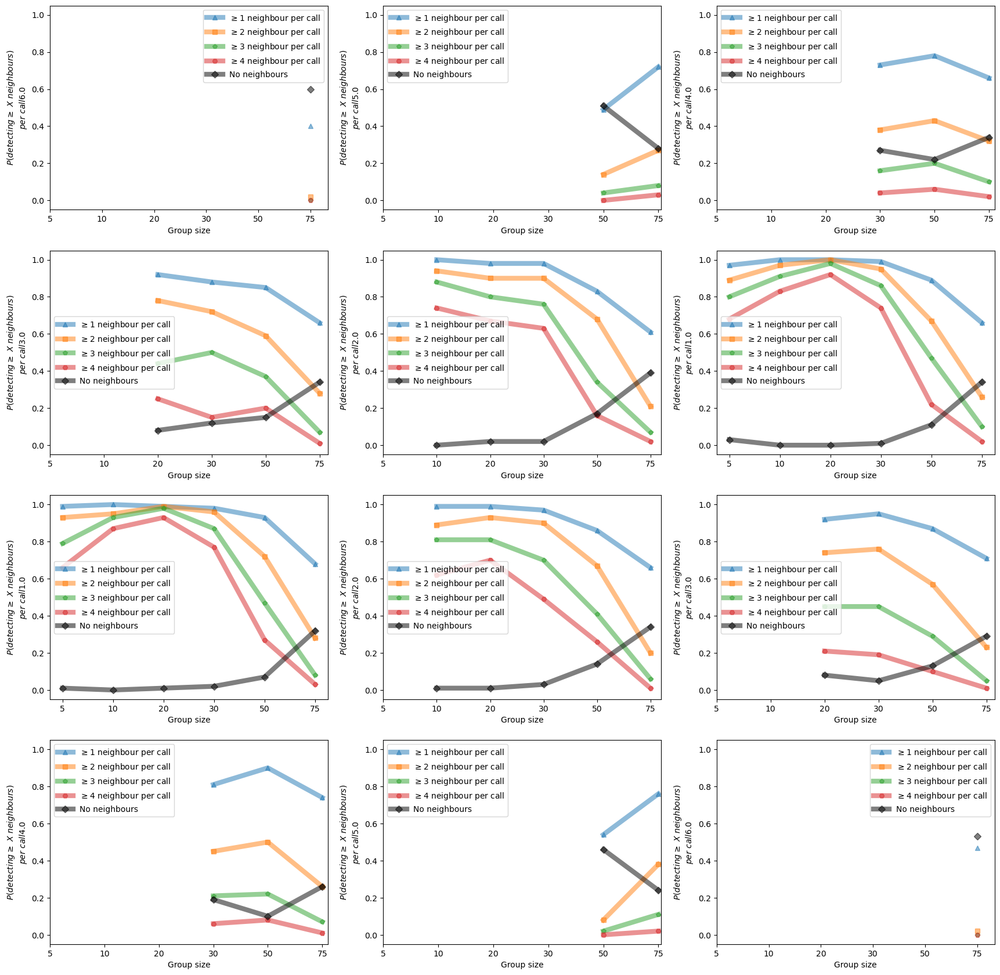

In [213]:
store_probability_of_detection_n_neighbour= store_nbrs_across_heading_var[heading_var]
i=0; 
number_of_columns=3; number_of_rows= int(np.ceil(len(sublist_of_simulation_data_intransect)/number_of_columns))
plt.figure(figsize= (21,21))
for simulation_data in sublist_of_simulation_data_intransect:
        data_by_groupsize = simulation_data.groupby(['group_size'])
        groupsizes= group_sizes

        key_for_dict= simulation_data["focal_bat"][0][0]*sign_based_on_distance_from_centermost_point[i]
        nbrs_detected_data= store_probability_of_detection_n_neighbour[key_for_dict]

        plt.subplot(number_of_rows,number_of_columns,i+1)
        plt.plot(np.arange(1,len(groupsizes)+1), 
                nbrs_detected_data['geq_1neighbour'], '-^', linewidth=6, alpha=0.5, label='$\geq1$ neighbour per call')
        plt.plot(np.arange(1,len(groupsizes)+1), 
                nbrs_detected_data['geq_2neighbour'], '-s', linewidth=6, alpha=0.5, label='$\geq2$ neighbour per call')
        plt.plot(np.arange(1,len(groupsizes)+1), 
                nbrs_detected_data['geq_3neighbour'], '-p', linewidth=6, alpha=0.5, label='$\geq3$ neighbour per call')
        plt.plot(np.arange(1,len(groupsizes)+1), 
                nbrs_detected_data['geq_4neighbour'], '-H', linewidth=6, alpha=0.5, label='$\geq4$ neighbour per call')
        plt.plot(np.arange(1,len(groupsizes)+1), 
                nbrs_detected_data['0neighbours'], '-Dk', linewidth=6, alpha=0.5, label='No neighbours')

        plt.yticks(fontsize=10)
        plt.xticks(np.arange(1,len(groupsizes)+1),
                groupsizes,fontsize=10)
        plt.legend()
        plt.ylabel('$P(detecting \geq \ X \ neighbours)$'+'\n'+ '$per \ call$'+str(simulation_data["focal_bat"][0][0]),
                fontsize=10)
        plt.xlabel('Group size',
                fontsize=10)
        plt.ylim(-0.05,1.05)
        
        i+=1

In [264]:
print(group_heading_variation)
j=0
plt.figure(figsize= (100,100))
for heading_var in group_heading_variation:
        
        store_probability_of_detection_n_neighbour = store_nbrs_across_heading_var[heading_var]
        number_of_neighbours_atleast_detected= [0,1,2,3,4]
        i=0; 
        number_of_columns=5; number_of_rows= 6#int(np.ceil(len(number_of_neighbours_atleast_detected)/number_of_columns))
        

        for simulation_data in sublist_of_simulation_data_intransect:
                color_given_index= colors[int(float(simulation_data["focal_bat"][0][0]))-1]
                groupsizes= group_sizes

                key_for_dict= simulation_data["focal_bat"][0][0]*sign_based_on_distance_from_centermost_point[i]
                # print(key_for_dict)
                # print(simulation_data["focal_bat"][0][0])
                nbrs_detected_data= store_probability_of_detection_n_neighbour[key_for_dict]

                if sign_based_on_distance_from_centermost_point[i]<0:
                        ls= ".-"
                else:
                        ls= "--"

                plt.subplot(number_of_rows,number_of_columns,2+5*j)
                plt.plot(np.arange(1,len(groupsizes)+1), 
                        nbrs_detected_data['geq_1neighbour'], ls, alpha=0.5, label=f'distance={key_for_dict}', color= color_given_index, lw=8)
                
                plt.subplot(number_of_rows,number_of_columns,3+5*j)
                plt.plot(np.arange(1,len(groupsizes)+1), 
                        nbrs_detected_data['geq_2neighbour'], ls, alpha=0.5, label=f'distance={key_for_dict}', color=color_given_index, lw=8)
                
                plt.subplot(number_of_rows,number_of_columns,4+5*j)
                plt.plot(np.arange(1,len(groupsizes)+1), 
                        nbrs_detected_data['geq_3neighbour'], ls, alpha=0.5, label=f'distance={key_for_dict}', color=color_given_index, lw=8)
                
                plt.subplot(number_of_rows,number_of_columns,5+5*j)
                plt.plot(np.arange(1,len(groupsizes)+1), 
                        nbrs_detected_data['geq_4neighbour'], ls, alpha=0.5, label=f'distance={key_for_dict}', color=color_given_index, lw=8)
                
                plt.subplot(number_of_rows,number_of_columns,1+5*j)
                plt.plot(np.arange(1,len(groupsizes)+1), 
                        nbrs_detected_data['0neighbours'], ls, alpha=0.5, label=f'distance={key_for_dict}', color=color_given_index, lw=8)
                i+=1
        for i in range(1,6):
                if i==1:
                        plt.subplot(number_of_rows,number_of_columns,i+5*j)
                        plt.yticks(fontsize=10)
                        plt.xticks(np.arange(1,len(groupsizes)+1),
                                groupsizes,fontsize=10)
                        plt.legend()
                        plt.title(f"$\leq{i-1}$ neighbour per call;")
                else: 
                        plt.subplot(number_of_rows,number_of_columns,i+5*j)
                        plt.yticks(fontsize=10)
                        plt.xticks(np.arange(1,len(groupsizes)+1),
                                groupsizes,fontsize=10)
                        plt.legend()
                        plt.title(f"$\geq{i-1}$ neighbour per call;")
                plt.ylabel('$P(detecting \geq \ X \ neighbours)$'+'\n'+ '$per \ call$'+str(simulation_data["focal_bat"][0][0]),
                        fontsize=10)
                plt.xlabel('Group size',
                        fontsize=10)
                plt.ylim(-0.05,1.05)
        j+=1
plt.show()

[0, 10, 30, 50, 'swarming', 'flocking']


In [75]:
nbrs_detected_data['0neighbours']

[nan, nan, nan, nan, nan, np.float64(0.63)]

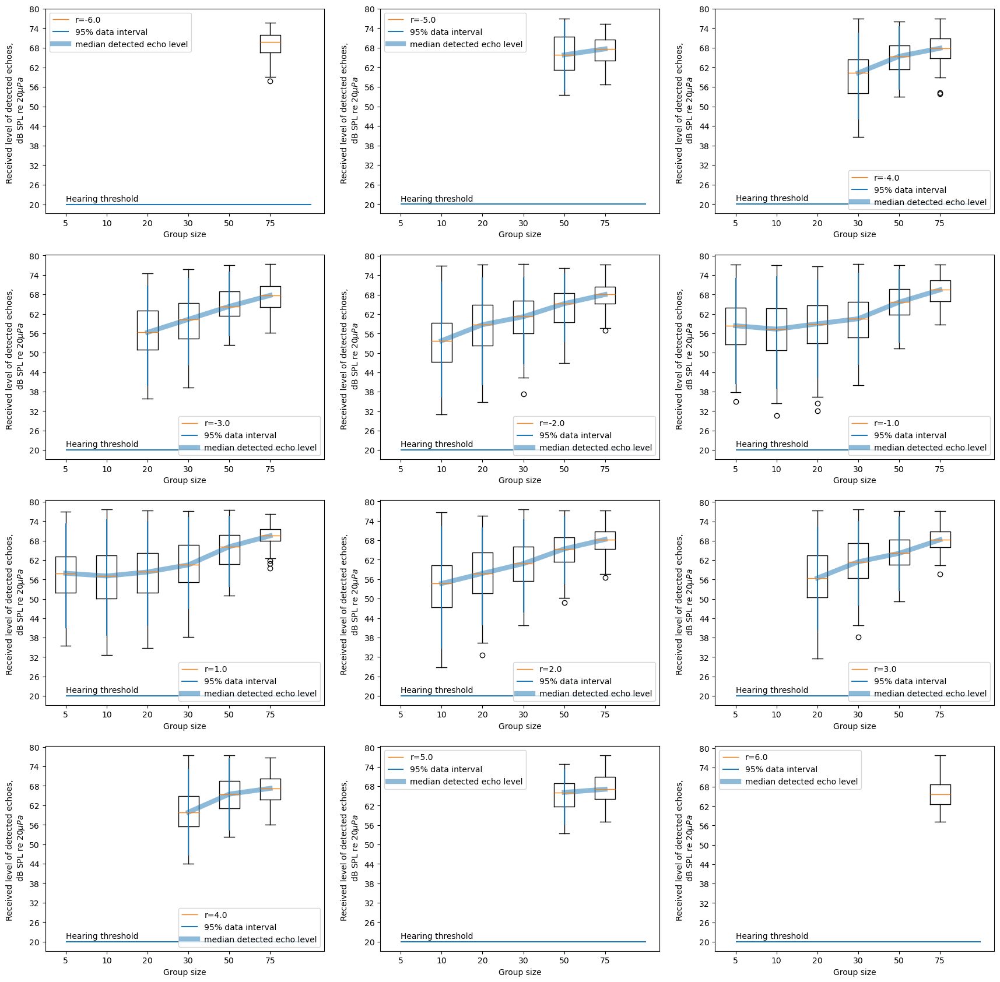

In [78]:

i=0; 
number_of_columns=3; number_of_rows= int(np.ceil(len(sublist_of_simulation_data_intransect)/number_of_columns))
plt.figure(figsize= (21,21))
for simulation_data in sublist_of_simulation_data_intransect:
        groupsizes= group_sizes
        key_for_dict= simulation_data["focal_bat"][0][0]*sign_based_on_distance_from_centermost_point[i]
        nbrs_detected_data= store_probability_of_detection_n_neighbour[key_for_dict]
        # print(nbrs_detected_data['median_echolevels'])
        plt.subplot(number_of_rows,number_of_columns,i+1)
        plt.boxplot(nbrs_detected_data['echolevels'][:], label=f"r={key_for_dict}");
        plt.vlines(range(1,len(nbrs_detected_data['95%ile_echolevels'])+1),nbrs_detected_data['5%ile_echolevels'],
                                                                        nbrs_detected_data['95%ile_echolevels'],
                                label='95% data interval')

        plt.plot(range(1,len(groupsizes)+1), nbrs_detected_data['median_echolevels'], linewidth=6, alpha=0.5,
                label='median detected echo level')
        plt.ylabel('Received level of detected echoes, \n dB SPL re 20$\mu Pa$',
                                                fontsize=10)
        plt.xticks(np.arange(1,len(groupsizes)+1), groupsizes, fontsize=10)
        plt.hlines([20],1,len(groupsizes)+1)
        plt.yticks(np.arange(20,86,6),np.arange(20,86,6), fontsize=10)
        plt.text(1,21,'Hearing threshold', fontsize=10)
        plt.xlabel('Group size', fontsize=10)
        plt.legend()
        # print(key_f
        # or_dict)
        i+=1

/tmp/ipykernel_224483/4001297594.py:29: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


6.0


/tmp/ipykernel_224483/4001297594.py:29: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()
/tmp/ipykernel_224483/4001297594.py:29: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()
/tmp/ipykernel_224483/4001297594.py:29: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()
/tmp/ipykernel_224483/4001297594.py:29: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()
/tmp/ipykernel_224483/4001297594.py:29: UserWarning: No artists with labels found to put in legend. 

6.0
6.0
6.0
6.0
6.0


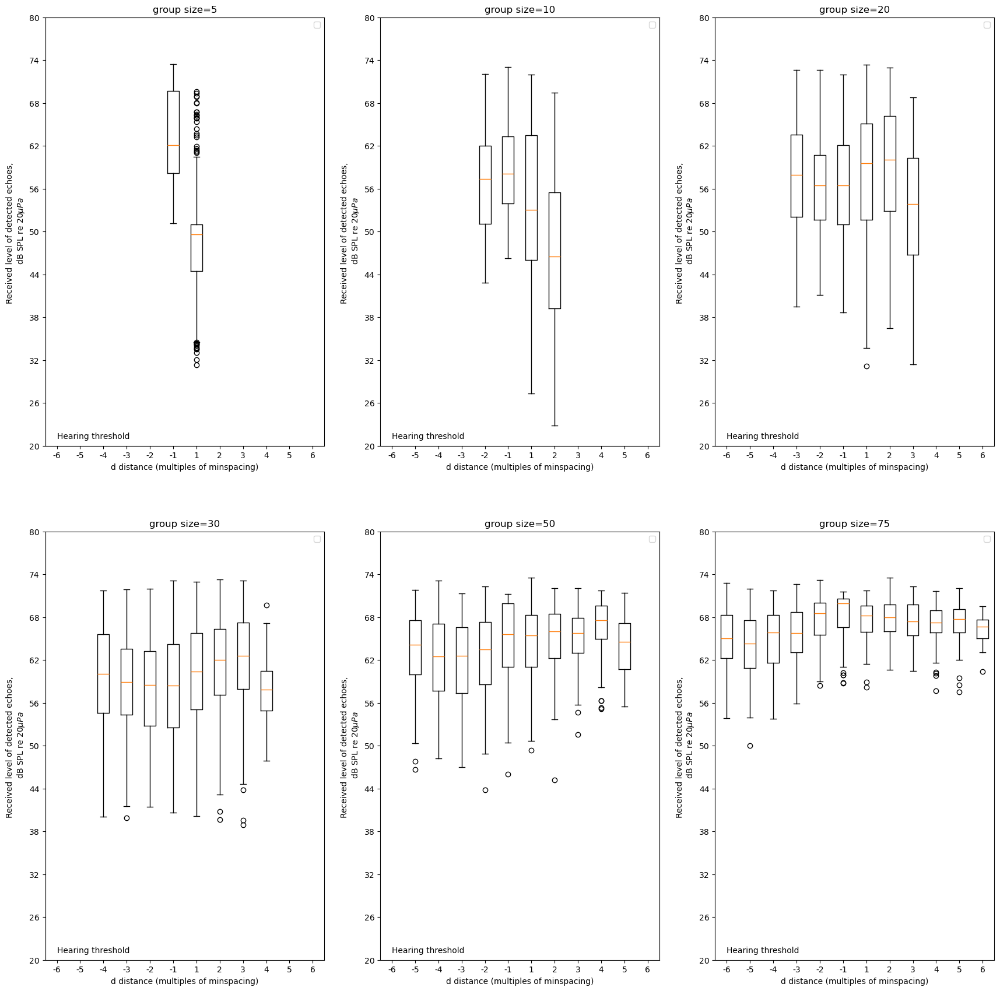

In [234]:
store_probability_of_detection_n_neighbour= store_nbrs_across_heading_var[10]
i=0; 

d_distances_along_transect= np.arange(-6,7,1)
number_of_columns=3; number_of_rows= int(np.ceil(len(group_sizes)/number_of_columns))
plt.figure(figsize= (21,21))
for group_size in group_sizes:
        array_storing_info_for_plot= []
        iterant_sign=-1
        x_ticks=[]
        for key in d_distances_along_transect:
                if key==0:
                        continue
                iterant_sign+=1
                nbrs_detected_data= store_probability_of_detection_n_neighbour[key]
                data_to_store= nbrs_detected_data['echolevels'][group_sizes.index(group_size)]
                array_storing_info_for_plot.append(data_to_store)
                x_ticks.append(key)

        plt.subplot(number_of_rows,number_of_columns,i+1)
        plt.boxplot(array_storing_info_for_plot);

        plt.ylabel('Received level of detected echoes, \n dB SPL re 20$\mu Pa$',
                                                fontsize=10)
        plt.xticks(np.arange(1,len(x_ticks)+1), x_ticks, fontsize=10)
        plt.yticks(np.arange(20,86,6),np.arange(20,86,6), fontsize=10)
        plt.text(1,21,'Hearing threshold', fontsize=10)
        plt.xlabel('d distance (multiples of minspacing)', fontsize=10)
        plt.legend()
        plt.title(f"group size={group_size}")
        print(key_for_dict)
        i+=1

In [81]:
store_probability_of_detection_n_neighbour.keys()

dict_keys([-6.0, -5.0, -4.0, -3.0, -2.0, -1.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0])

-6.0
-5.0
-4.0
-3.0
-2.0
-1.0
1.0
2.0
3.0
4.0
5.0
6.0


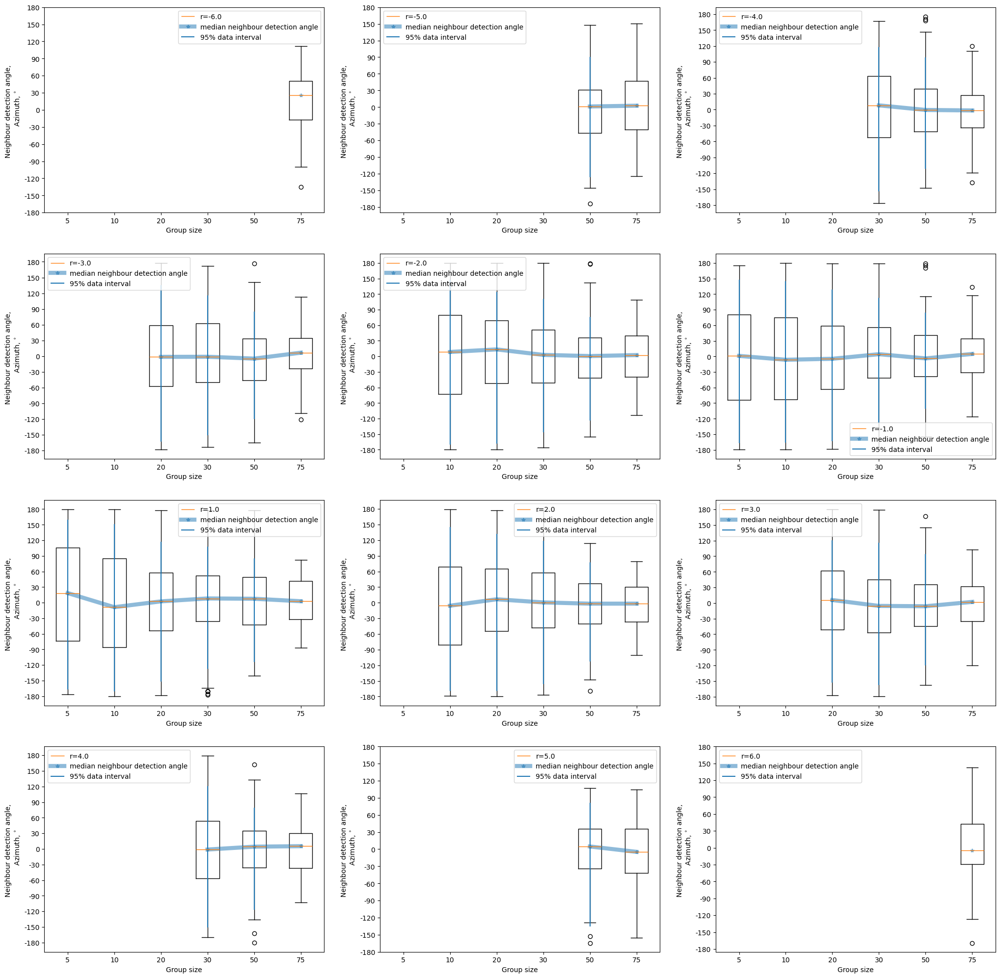

In [82]:
i=0; 
number_of_columns=3; number_of_rows= int(np.ceil(len(sublist_of_simulation_data_intransect)/number_of_columns))
plt.figure(figsize= (25,25))
for simulation_data in sublist_of_simulation_data_intransect:
        groupsizes= group_sizes
        key_for_dict= simulation_data["focal_bat"][0][0]*sign_based_on_distance_from_centermost_point[i]
        nbrs_detected_data= store_probability_of_detection_n_neighbour[key_for_dict]

        plt.subplot(number_of_rows,number_of_columns,i+1)
        plt.boxplot(nbrs_detected_data['neighbours_azimuth'][:], label=f"r={key_for_dict}")
        plt.plot(np.arange(1,7), nbrs_detected_data['median_neighbours_azimuth'], '-*', linewidth=6,
                        alpha=0.5, label='median neighbour detection angle')
        plt.vlines(range(1,len(nbrs_detected_data['5%ile_neighbours_azimuth'])+1),nbrs_detected_data['5%ile_neighbours_azimuth'],
                nbrs_detected_data['95%ile_neighbours_azimuth'], label='95% data interval')
        #plt.plot(np.arange(1,8), nbrs_detected_data['95%ile_neighbours_azimuth'], 'g')
        #plt.plot(np.arange(1,8), nbrs_detected_data['5%ile_neighbours_azimuth'], 'g', label='95%  neighbour detection range')

        plt.yticks(np.arange(-180,210,30), np.arange(-180,210,30), fontsize=10)
        plt.xticks(np.arange(1,7), group_sizes, fontsize=10)
        plt.legend()
        plt.ylabel('Neighbour detection angle, \n  Azimuth, $^{\circ}$', fontsize=10)
        plt.xlabel('Group size', fontsize=10)


        print(key_for_dict)
        i+=1

(array([10., 20., 18., 31., 21., 24., 25., 19.,  9.,  4.]),
 array([-110.6244 ,  -86.20075,  -61.7771 ,  -37.35345,  -12.9298 ,
          11.49385,   35.9175 ,   60.34115,   84.7648 ,  109.18845,
         133.6121 ]),
 <BarContainer object of 10 artists>)

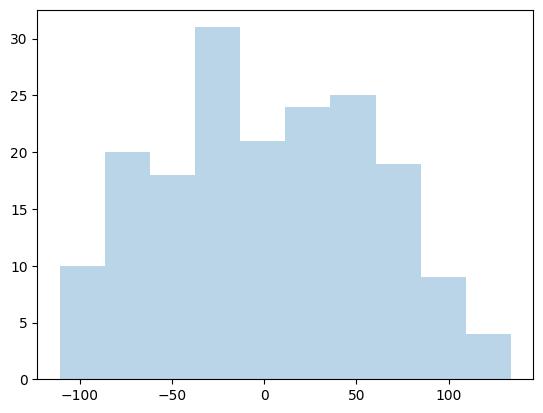

In [ ]:
nbrs_detected_data= store_probability_of_detection_n_neighbour[3]
plt.hist(nbrs_detected_data['neighbours_azimuth'][4], alpha=0.3)
# print(np.sum(plt.hist(nbrs_detected_data['neighbours_azimuth'][6])[0]))

/tmp/ipykernel_224483/3498775721.py:28: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()
/tmp/ipykernel_224483/3498775721.py:28: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()
/tmp/ipykernel_224483/3498775721.py:28: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()
/tmp/ipykernel_224483/3498775721.py:28: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()
/tmp/ipykernel_224483/3498775721.py:28: UserWarning: No artists with labels found to put in legend. 

6.0
6.0
6.0
6.0
6.0
6.0


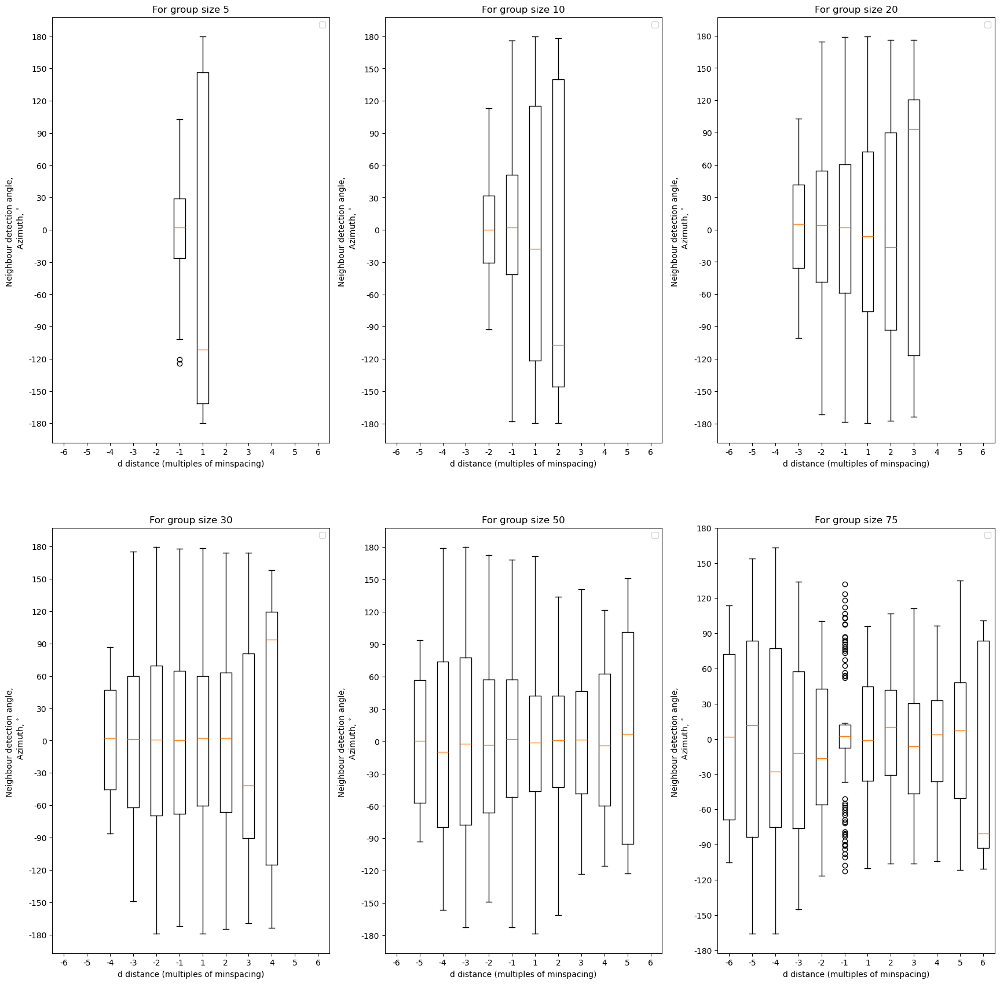

In [235]:
store_probability_of_detection_n_neighbour= store_nbrs_across_heading_var[10]
i=0; 
d_distances_along_transect= np.arange(-6,7,1)
number_of_columns=3; number_of_rows= int(np.ceil(len(group_sizes)/number_of_columns))
plt.figure(figsize= (21,21))
for group_size in group_sizes:
        array_storing_info_for_plot= []
        iterant_sign=-1
        x_ticks=[]
        for key in d_distances_along_transect:
                if key==0:
                        continue
                iterant_sign+=1
                nbrs_detected_data= store_probability_of_detection_n_neighbour[key]
                data_to_store= nbrs_detected_data['neighbours_azimuth'][group_sizes.index(group_size)]
                array_storing_info_for_plot.append(data_to_store)
                x_ticks.append(key)

        plt.subplot(number_of_rows,number_of_columns,i+1)
        plt.boxplot(array_storing_info_for_plot);

        plt.yticks(np.arange(-180,210,30), np.arange(-180,210,30), fontsize=10)
        plt.xticks(np.arange(1,len(x_ticks)+1), x_ticks, fontsize=10)

        plt.ylabel('Neighbour detection angle, \n  Azimuth, $^{\circ}$', fontsize=10)
        plt.xlabel('d distance (multiples of minspacing)', fontsize=10)
        plt.title(f"For group size {group_size}")
        plt.legend()
        print(key_for_dict)
        i+=1

In [ ]:
def modify_dict_for_seaborn(input_dict,key_x,key_y):
    radial_dist= input_dict.keys()
    x,y,hue= [], [], []
    for r in radial_dist:
        data_to_plotted= input_dict[r]
        y_axis_raw= data_to_plotted[key_y]
        x_axis_raw= data_to_plotted[key_x]

        for index_group_sizes in range(len(x_axis_raw)):
            group_size= x_axis_raw[index_group_sizes]
            y_corresponding_to_group_size= y_axis_raw[index_group_sizes]
            # print(y_corresponding_to_group_size)
            for entry in y_corresponding_to_group_size:
                y.append(entry)
                x.append(group_size)
                hue.append(r)

    return x,y,hue

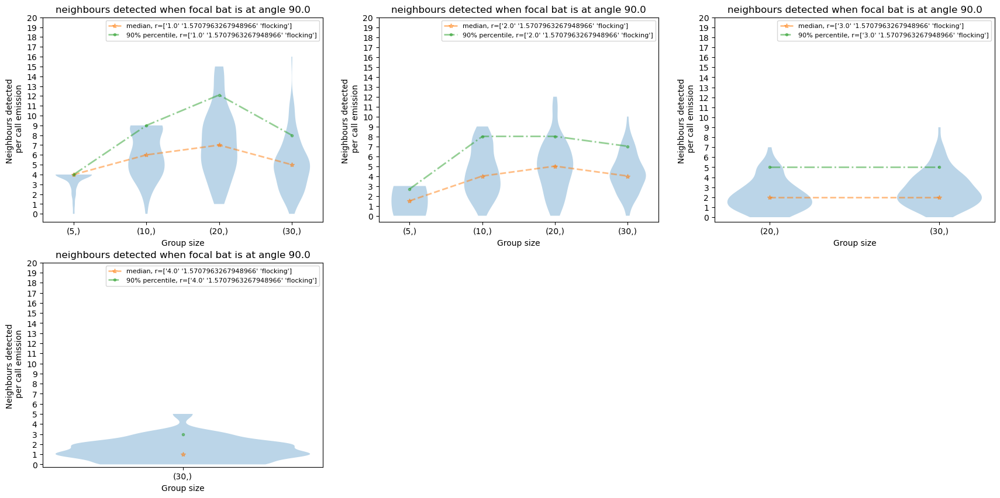

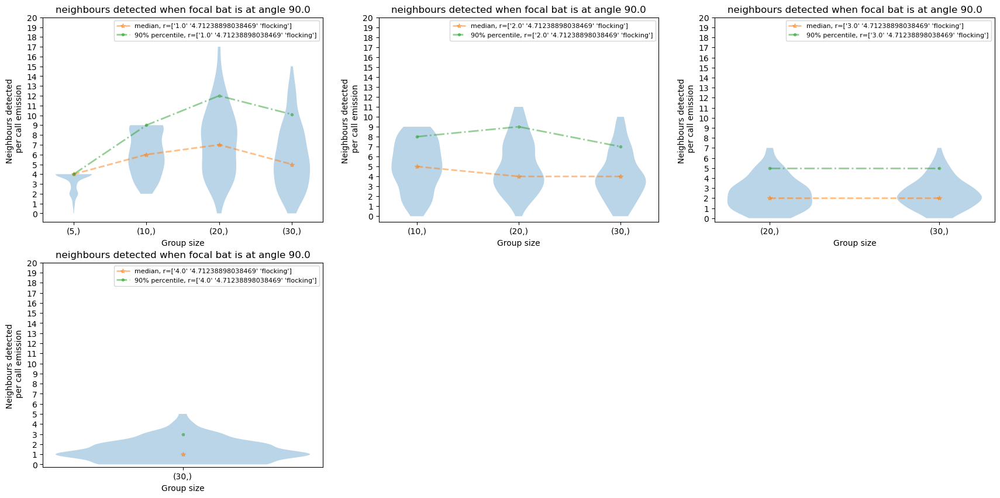

In [ ]:
iterant1_axis=0
# fig, axs = plt.subplots(1,3, figsize=(27,9))


for angle in list_containing_simulated_data_sorted_by_angles.keys():
        subset_given_angle= list_containing_simulated_data_sorted_by_angles[angle][0]; iterant2_color=0
        
        plt.figure(figsize=(21,10))
        i=1
        for simulation_data in subset_given_angle:
                data_by_groupsize = simulation_data.groupby(['group_size'])
                nbrs_detected_data = {}
                nbrs_detected_data['num_nbrs'] = []
                nbrs_detected_data['median_num_nbrs'] = []
                nbrs_detected_data['90%ile_num_nbrs'] = []
                groupsizes= []
                for groupsize, dataframe in data_by_groupsize:
                        groupsizes.append(groupsize)
                        nbrs_detected_data['num_nbrs'].append(np.array(dataframe['nbrs_detected']))
                        nbrs_detected_data['median_num_nbrs'].append(np.median(np.array(dataframe['nbrs_detected'])))
                        nbrs_detected_data['90%ile_num_nbrs'].append(np.percentile(np.array(dataframe['nbrs_detected']), 90))

                breakup_x_axis  = np.arange(1,len(groupsizes)+1)+0.5
                nbrs_detected_data['median_num_nbrs']

                # plt.figure(figsize=(7,3.42))
                plt.subplot(2,3,i)
                plt.violinplot(nbrs_detected_data['num_nbrs'][:], showextrema=False)
                plt.plot(np.arange(1,len(groupsizes)+1),nbrs_detected_data['median_num_nbrs'][:],
                        '--*',linewidth=2, alpha=0.5,label="median, r="+str(simulation_data["focal_bat"][0]))#'median')
                # print(np.arange(1,len(groupsizes)))
                plt.plot(np.arange(1,len(groupsizes)+1), nbrs_detected_data['90%ile_num_nbrs'][:],
                        '-..',linewidth=2, alpha=0.5, label="90% percentile, r="+str(simulation_data["focal_bat"][0]))#label='90%ile')
                # plt.vlines(breakup_x_axis, -1,20, 'w',linewidth=30,alpha=1.0)
                plt.yticks(np.arange(0,21,1))
                plt.xticks(range(1,len(groupsizes)+1),groupsizes[:])
                plt.legend(fontsize=8)
                plt.ylabel('Neighbours detected \n per call emission', fontsize=10)
                plt.xlabel('Group size', fontsize=10)
                # # plt.ylim(0,20)

                # axs[i].tight_layout()
                plt.title("neighbours detected when focal bat is at angle "+str(np.degrees(np.pi/2)))
                iterant2_color+=1; i+=1
                
        iterant1_axis+=1
                # plt.savefig('Figure2_groupsize_1200dpi.pdf',
                #         bbox_inches='tight', pad_inches=0.05, format='pdf', dpi=1200)
        
        # print(groupsizes); print(nbrs_detected_data['median_num_nbrs'])

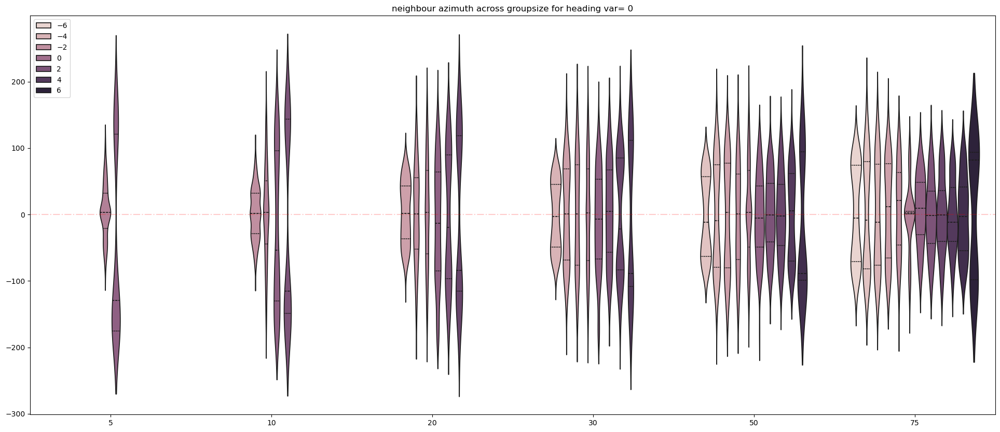

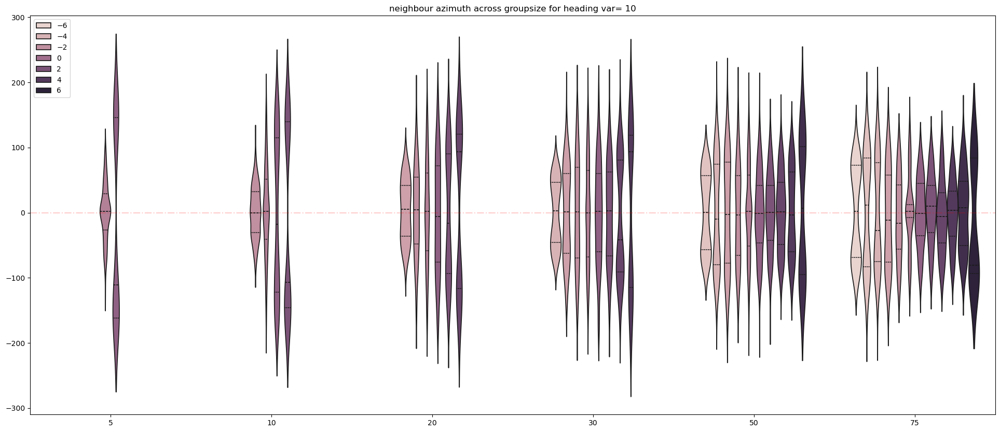

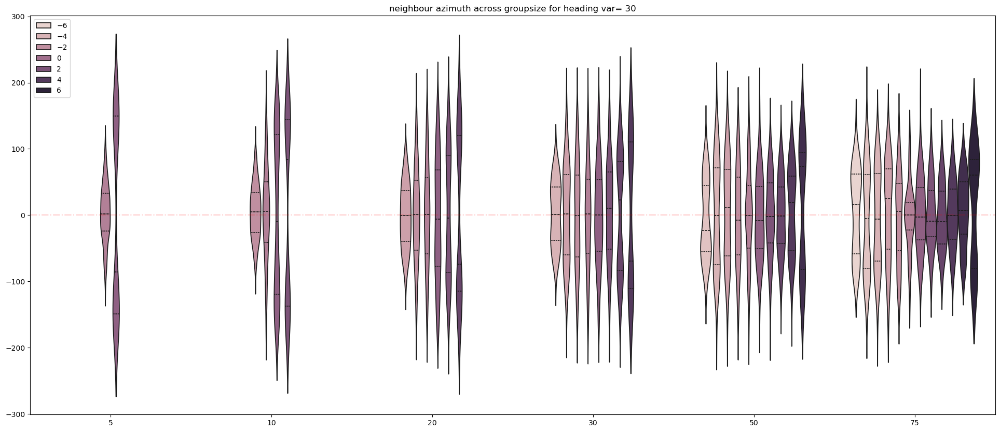

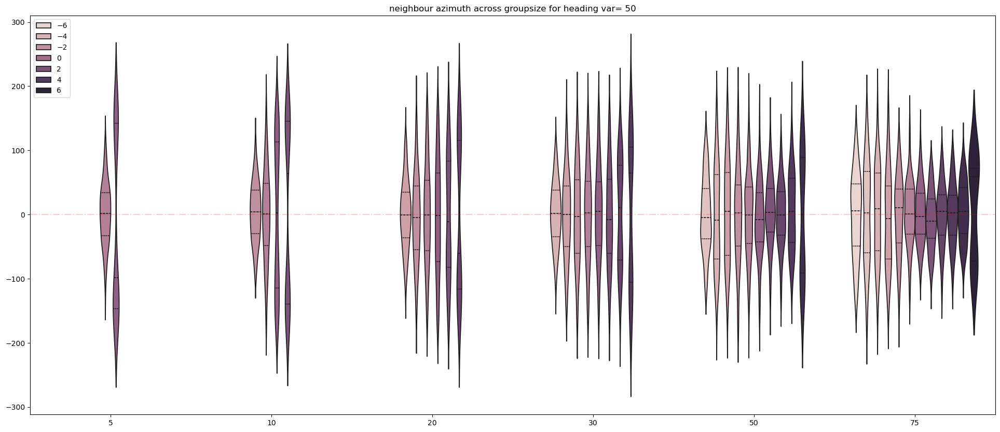

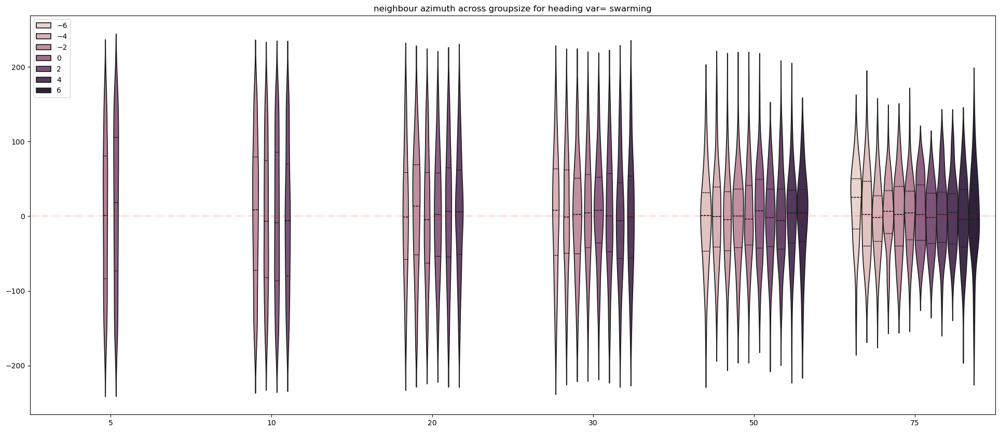

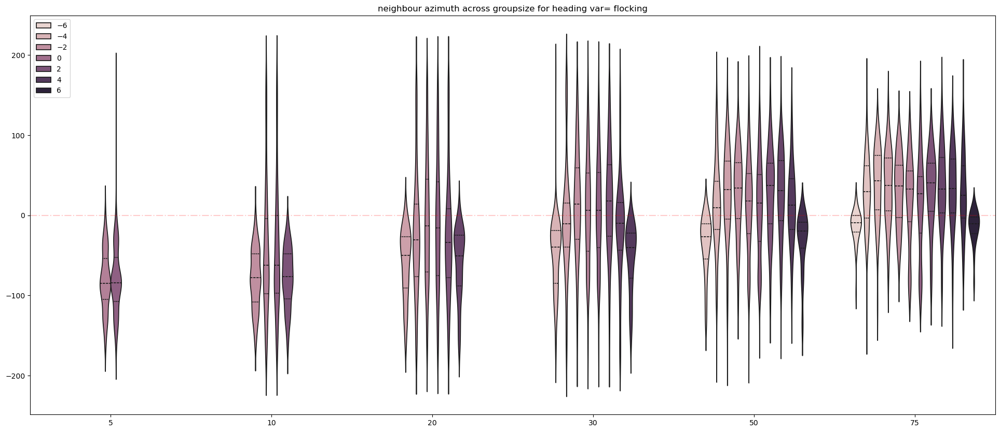

In [265]:
for heading_var in group_heading_variation:
    store_probability_of_detection_n_neighbour= store_nbrs_across_heading_var[heading_var]
    x,y,hue= modify_dict_for_seaborn(store_probability_of_detection_n_neighbour, "group_sizes", "neighbours_azimuth")
    plt.figure(figsize=(24,10))
    plt.axhline(0, ls= "-.", color="red", alpha=0.2)
    sns.violinplot(x=x, y=y, hue=hue, inner="quart", hue_order=store_probability_of_detection_n_neighbour.keys())
    plt.title("neighbour azimuth across groupsize for heading var= "+ str(heading_var))
# plt.ylim(-180,180)

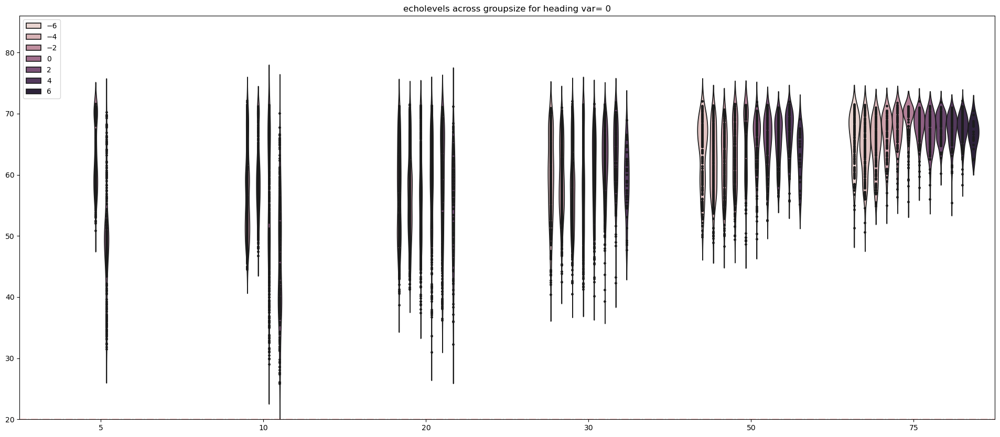

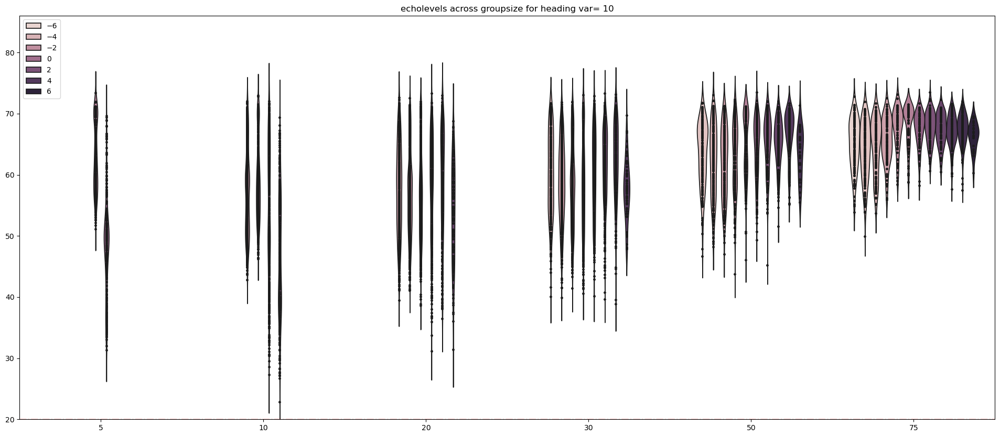

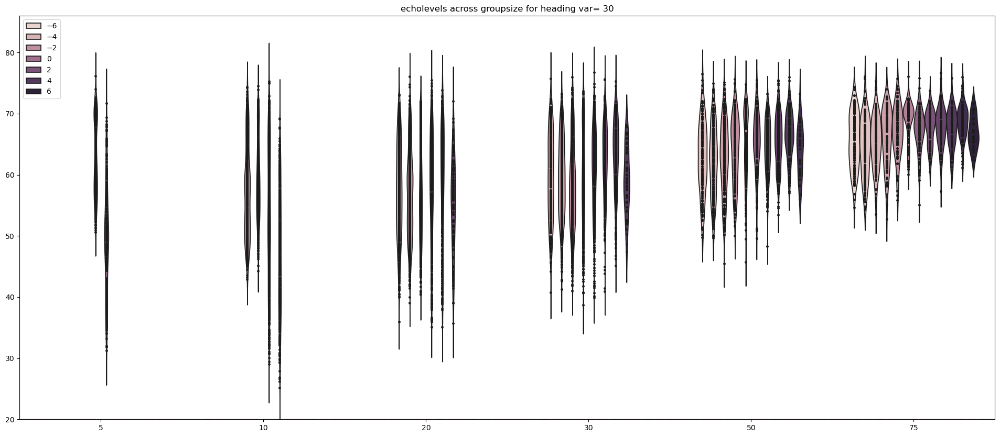

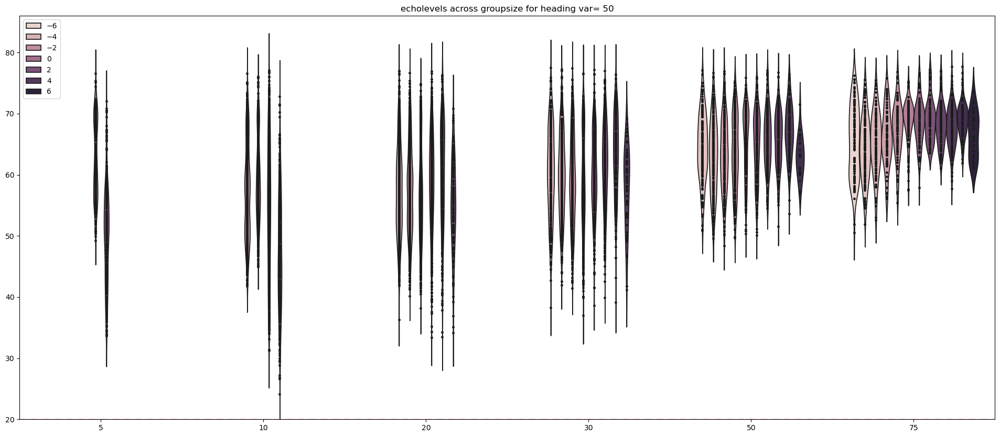

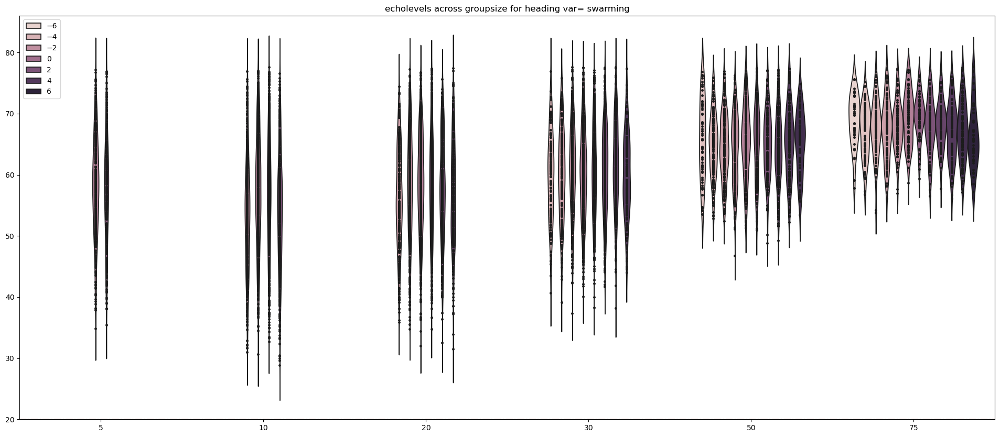

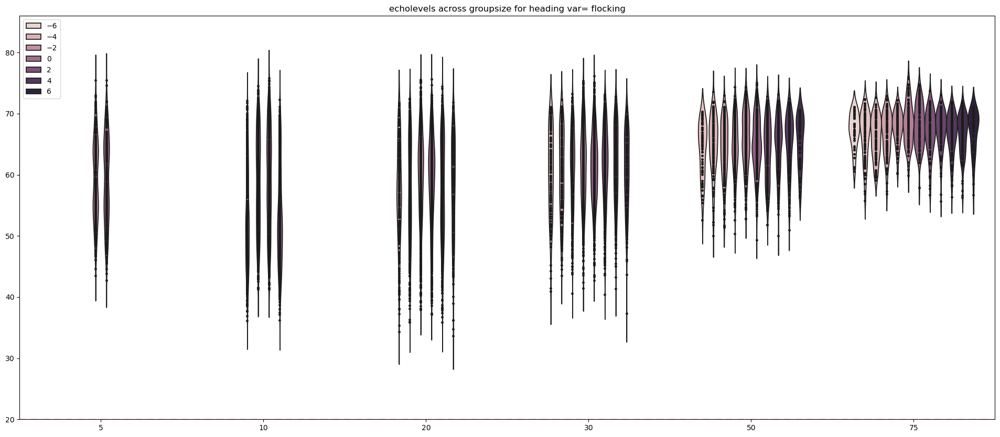

In [244]:
for heading_var in group_heading_variation:
    store_probability_of_detection_n_neighbour= store_nbrs_across_heading_var[heading_var]
    x,y,hue= modify_dict_for_seaborn(store_probability_of_detection_n_neighbour, "group_sizes", "echolevels")
    plt.figure(figsize=(24,10))
    plt.axhline(20, ls= "-.", color="red", alpha=0.2)
    sns.violinplot(x=x, y=y, hue=hue, inner="point", hue_order=store_probability_of_detection_n_neighbour.keys())
    plt.title("echolevels across groupsize for heading var= "+ str(heading_var))
    plt.ylim(20,86)


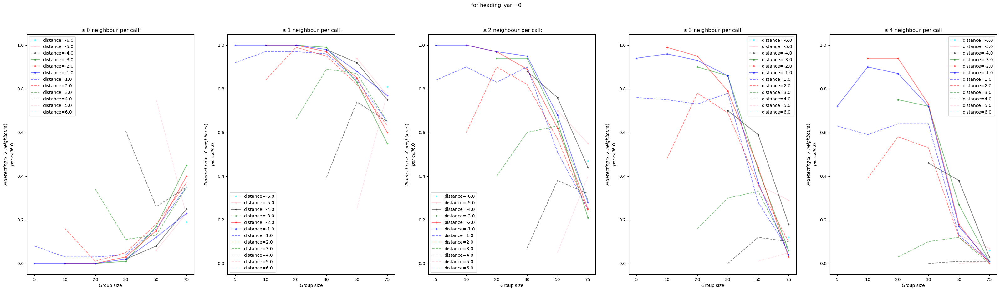

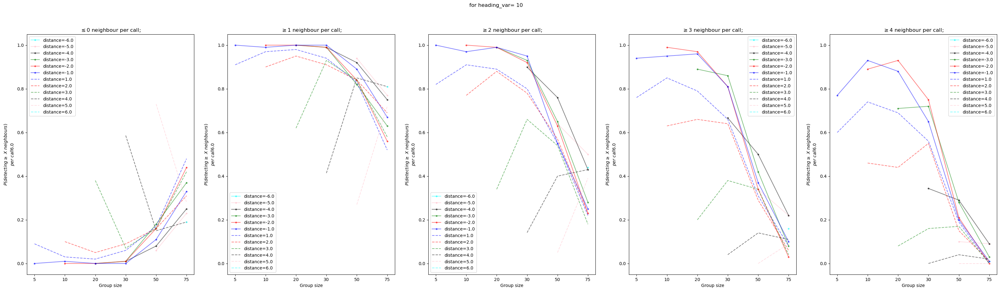

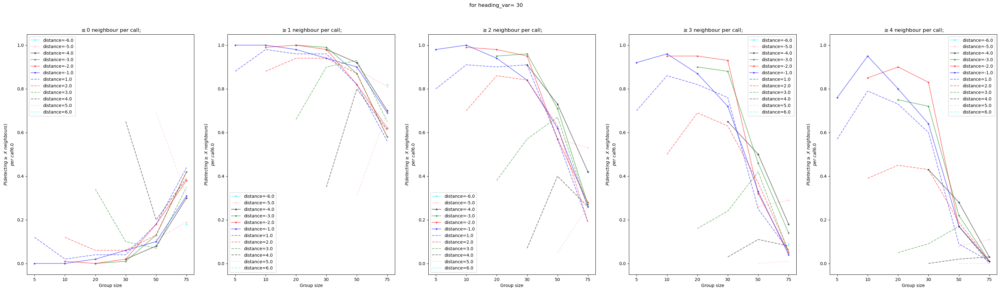

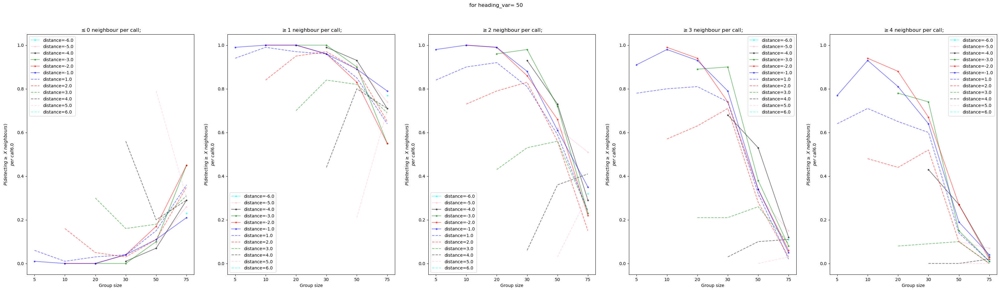

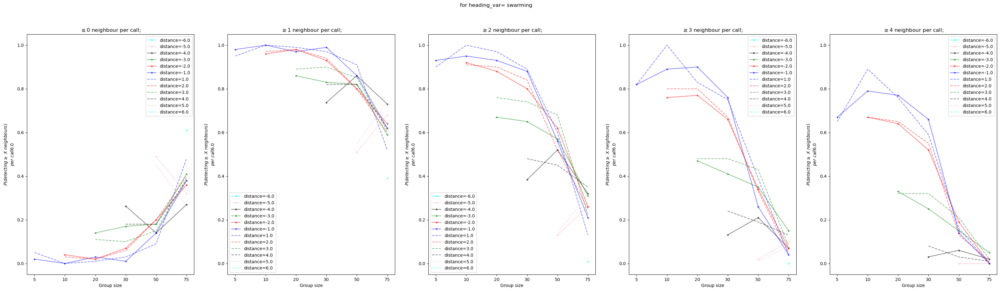

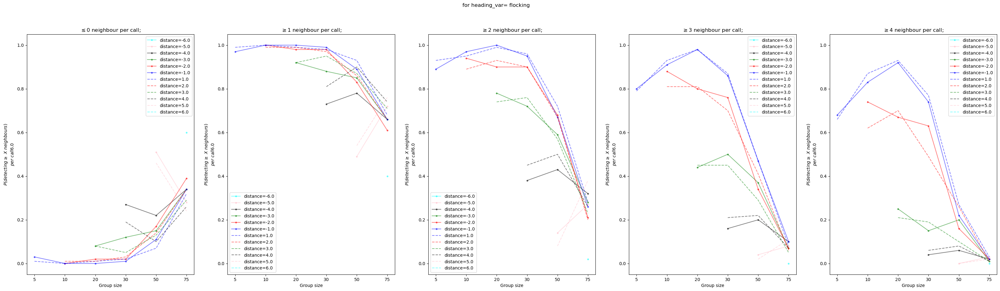

In [257]:
j=0

for heading_var in group_heading_variation:
        j=0
        plt.figure(figsize= (40,10))
        store_probability_of_detection_n_neighbour = store_nbrs_across_heading_var[heading_var]
        number_of_neighbours_atleast_detected= [0,1,2,3,4]
        i=0; 
        number_of_columns=5; number_of_rows= 1#int(np.ceil(len(number_of_neighbours_atleast_detected)/number_of_columns))
        

        for simulation_data in sublist_of_simulation_data_intransect:
                color_given_index= colors[int(float(simulation_data["focal_bat"][0][0]))-1]
                groupsizes= group_sizes

                key_for_dict= simulation_data["focal_bat"][0][0]*sign_based_on_distance_from_centermost_point[i]
                # print(key_for_dict)
                # print(simulation_data["focal_bat"][0][0])
                nbrs_detected_data= store_probability_of_detection_n_neighbour[key_for_dict]

                if sign_based_on_distance_from_centermost_point[i]<0:
                        ls= ".-"
                else:
                        ls= "--"

                plt.subplot(number_of_rows,number_of_columns,2+5*j)
                plt.plot(np.arange(1,len(groupsizes)+1), 
                        nbrs_detected_data['geq_1neighbour'], ls, alpha=0.5, label=f'distance={key_for_dict}', color= color_given_index)
                
                plt.subplot(number_of_rows,number_of_columns,3+5*j)
                plt.plot(np.arange(1,len(groupsizes)+1), 
                        nbrs_detected_data['geq_2neighbour'], ls, alpha=0.5, label=f'distance={key_for_dict}', color=color_given_index)
                
                plt.subplot(number_of_rows,number_of_columns,4+5*j)
                plt.plot(np.arange(1,len(groupsizes)+1), 
                        nbrs_detected_data['geq_3neighbour'], ls, alpha=0.5, label=f'distance={key_for_dict}', color=color_given_index)
                
                plt.subplot(number_of_rows,number_of_columns,5+5*j)
                plt.plot(np.arange(1,len(groupsizes)+1), 
                        nbrs_detected_data['geq_4neighbour'], ls, alpha=0.5, label=f'distance={key_for_dict}', color=color_given_index)
                
                plt.subplot(number_of_rows,number_of_columns,1+5*j)
                plt.plot(np.arange(1,len(groupsizes)+1), 
                        nbrs_detected_data['0neighbours'], ls, alpha=0.5, label=f'distance={key_for_dict}', color=color_given_index)
                i+=1
        for i in range(1,6):
                if i==1:
                        plt.subplot(number_of_rows,number_of_columns,i+5*j)
                        plt.yticks(fontsize=10)
                        plt.xticks(np.arange(1,len(groupsizes)+1),
                                groupsizes,fontsize=10)
                        plt.legend()
                        plt.title(f"$\leq{i-1}$ neighbour per call;")
                else: 
                        plt.subplot(number_of_rows,number_of_columns,i+5*j)
                        plt.yticks(fontsize=10)
                        plt.xticks(np.arange(1,len(groupsizes)+1),
                                groupsizes,fontsize=10)
                        plt.legend()
                        plt.title(f"$\geq{i-1}$ neighbour per call;")
                plt.ylabel('$P(detecting \geq \ X \ neighbours)$'+'\n'+ '$per \ call$'+str(simulation_data["focal_bat"][0][0]),
                        fontsize=10)
                plt.xlabel('Group size',
                        fontsize=10)
                plt.ylim(-0.05,1.05)
        plt.suptitle("for heading_var= " + str(heading_var))
        j+=1
plt.show()

In [ ]:
j=0

for heading_var in group_heading_variation:
        j=0
        plt.figure(figsize= (40,10))
        store_probability_of_detection_n_neighbour = store_nbrs_across_heading_var[heading_var]
        number_of_neighbours_atleast_detected= [0,1,2,3,4]
        i=0; 
        number_of_columns=5; number_of_rows= 1#int(np.ceil(len(number_of_neighbours_atleast_detected)/number_of_columns))
        

        for simulation_data in sublist_of_simulation_data_intransect:
                color_given_index= colors[int(float(simulation_data["focal_bat"][0][0]))-1]
                groupsizes= group_sizes

                key_for_dict= simulation_data["focal_bat"][0][0]*sign_based_on_distance_from_centermost_point[i]
                # print(key_for_dict)
                # print(simulation_data["focal_bat"][0][0])
                nbrs_detected_data= store_probability_of_detection_n_neighbour[key_for_dict]

                if sign_based_on_distance_from_centermost_point[i]<0:
                        ls= ".-"
                else:
                        ls= "--"

                plt.subplot(number_of_rows,number_of_columns,2+5*j)
                plt.plot(np.arange(1,len(groupsizes)+1), 
                        nbrs_detected_data['geq_1neighbour'], ls, alpha=0.5, label=f'distance={key_for_dict}', color= color_given_index)
                
                plt.subplot(number_of_rows,number_of_columns,3+5*j)
                plt.plot(np.arange(1,len(groupsizes)+1), 
                        nbrs_detected_data['geq_2neighbour'], ls, alpha=0.5, label=f'distance={key_for_dict}', color=color_given_index)
                
                plt.subplot(number_of_rows,number_of_columns,4+5*j)
                plt.plot(np.arange(1,len(groupsizes)+1), 
                        nbrs_detected_data['geq_3neighbour'], ls, alpha=0.5, label=f'distance={key_for_dict}', color=color_given_index)
                
                plt.subplot(number_of_rows,number_of_columns,5+5*j)
                plt.plot(np.arange(1,len(groupsizes)+1), 
                        nbrs_detected_data['geq_4neighbour'], ls, alpha=0.5, label=f'distance={key_for_dict}', color=color_given_index)
                
                plt.subplot(number_of_rows,number_of_columns,1+5*j)
                plt.plot(np.arange(1,len(groupsizes)+1), 
                        nbrs_detected_data['0neighbours'], ls, alpha=0.5, label=f'distance={key_for_dict}', color=color_given_index)
                i+=1
        for i in range(1,6):
                if i==1:
                        plt.subplot(number_of_rows,number_of_columns,i+5*j)
                        plt.yticks(fontsize=10)
                        plt.xticks(np.arange(1,len(groupsizes)+1),
                                groupsizes,fontsize=10)
                        plt.legend()
                        plt.title(f"$\leq{i-1}$ neighbour per call;")
                else: 
                        plt.subplot(number_of_rows,number_of_columns,i+5*j)
                        plt.yticks(fontsize=10)
                        plt.xticks(np.arange(1,len(groupsizes)+1),
                                groupsizes,fontsize=10)
                        plt.legend()
                        plt.title(f"$\geq{i-1}$ neighbour per call;")
                plt.ylabel('$P(detecting \geq \ X \ neighbours)$'+'\n'+ '$per \ call$'+str(simulation_data["focal_bat"][0][0]),
                        fontsize=10)
                plt.xlabel('Group size',
                        fontsize=10)
                plt.ylim(-0.05,1.05)
        plt.suptitle("for heading_var= " + str(heading_var))
        j+=1
plt.show()